In [ ]:
!pip install kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d thedevastator/tweet-sentiment-s-impact-on-stock-returns
!unzip tweet-sentiment-s-impact-on-stock-returns.zip
import os
path = os.getcwd() + "/tweet-sentiment-s-impact-on-stock-returns"
print("Path to dataset files:", path)


cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory
Dataset URL: https://www.kaggle.com/datasets/thedevastator/tweet-sentiment-s-impact-on-stock-returns
License(s): CC0-1.0
 88% 51.0M/57.9M [00:00<00:00, 67.0MB/s]
100% 57.9M/57.9M [00:00<00:00, 68.6MB/s]
Archive:  tweet-sentiment-s-impact-on-stock-returns.zip
  inflating: full_dataset-release.csv  
  inflating: reduced_dataset-release.csv  
Path to dataset files: /content/tweet-sentiment-s-impact-on-stock-returns


In [1]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
file_name= "final_processed_data.csv"
df = pd.read_csv(file_name)
df.head()

,DATE,LAST_PRICE,1_DAY_RETURN,2_DAY_RETURN,3_DAY_RETURN,7_DAY_RETURN,PX_VOLUME,VOLATILITY_10D,VOLATILITY_30D,LSTM_POLARITY,TEXTBLOB_POLARITY,VADER_POLARITY,risk_adjusted_return_1d,risk_adjusted_return_7d,avg_sentiment,CLEANED_TWEET,TOKENIZED_TWEET,EMBEDDINGS,STOCK_ENCODED,GLOVE_EMBEDDINGS
0,0,39.78,0.002011,0.012318,0.012318,0.054801,9100057.0,18.769,16.099,-1.0,0.0,0.0000,0.000107,0.003404,-0.333333,fame95fm1 jamaican make money payoneer paypal ...,"['fame95fm1', 'jamaican', 'make', 'money', 'pa...",[ 1.33660380e-02 -9.88923237e-02 -8.59524682e-...,93,[-0.26693123 0.2198803 0.2118568 -0.200012...
1,0,39.78,0.002011,0.012318,0.012318,0.054801,9100057.0,18.769,16.099,1.0,0.0,0.0000,0.000107,0.003404,0.333333,cbsi jamaican make money payoneer paypal paxum...,"['cbsi', 'jamaican', 'make', 'money', 'payonee...",[-1.51639462e-01 -3.50850761e-01 7.90033638e-...,93,[-2.58112548e-01 2.09796126e-01 2.15751067e-...
2,0,39.78,0.002011,0.012318,0.012318,0.054801,9100057.0,18.769,16.099,-1.0,0.0,0.0000,0.000107,0.003404,-0.333333,hitz92fm jamaican make money payoneer paypal p...,"['hitz92fm', 'jamaican', 'make', 'money', 'pay...",[-0.21960156 -0.14359392 -0.22134428 0.364187...,93,[-2.55862253e-01 2.06831524e-01 2.04137018e-...
3,0,55.22,0.012314,0.016298,0.016298,0.058312,14307985.0,23.916,17.298,1.0,0.2,0.6908,0.000515,0.003371,0.630267,rt nikitakhara thank starbucks ceo committing ...,"['rt', 'nikitakhara', 'thank', 'starbucks', 'c...",[-0.21587391 0.0840044 0.0930825 0.297041...,104,[-0.27002521 0.22786516 0.20910087 -0.234650...
4,0,39.78,0.002011,0.012318,0.012318,0.054801,9100057.0,18.769,16.099,-1.0,0.0,0.0000,0.000107,0.003404,-0.333333,gawker jamaican make money payoneer paypal pax...,"['gawker', 'jamaican', 'make', 'money', 'payon...",[-2.15505525e-01 -2.87429780e-01 -1.53491810e-...,93,[-0.28680614 0.2129475 0.21793218 -0.222420...


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18294 entries, 0 to 18293
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   DATE                     18294 non-null  object 
 1   LAST_PRICE               18294 non-null  float64
 2   1_DAY_RETURN             18294 non-null  float64
 3   2_DAY_RETURN             18294 non-null  float64
 4   3_DAY_RETURN             18294 non-null  float64
 5   7_DAY_RETURN             18294 non-null  float64
 6   PX_VOLUME                18294 non-null  float64
 7   VOLATILITY_10D           18294 non-null  float64
 8   VOLATILITY_30D           18294 non-null  float64
 9   LSTM_POLARITY            18294 non-null  float64
 10  TEXTBLOB_POLARITY        18294 non-null  float64
 11  VADER_POLARITY           18294 non-null  float64
 12  risk_adjusted_return_1d  18294 non-null  float64
 13  risk_adjusted_return_7d  18294 non-null  float64
 14  avg_sentiment         

In [3]:
df.shape

(18294, 20)

In [4]:
df.describe()

,LAST_PRICE,1_DAY_RETURN,2_DAY_RETURN,3_DAY_RETURN,7_DAY_RETURN,PX_VOLUME,VOLATILITY_10D,VOLATILITY_30D,LSTM_POLARITY,TEXTBLOB_POLARITY,VADER_POLARITY,risk_adjusted_return_1d,risk_adjusted_return_7d,avg_sentiment,sentiment_momentum
count,18294.000000,18294.000000,18294.000000,18294.000000,1.829400e+04,1.829400e+04,18294.000000,18285.000000,18294.000000,18294.000000,18294.000000,18294.000000,1.828500e+04,18294.000000,10921.000000
mean,520.865246,0.003804,0.006829,0.007212,5.481995e+05,1.067563e+07,24.233480,21.777208,0.130899,0.100682,0.143854,0.000151,-5.949451e+03,0.125145,0.035920
std,4410.601592,0.017716,0.022770,0.025354,5.102569e+06,1.285680e+07,15.299704,11.796747,0.965590,0.283282,0.427240,0.000677,5.133193e+06,0.417246,0.506053
min,-0.058532,-0.102684,-0.173554,-0.177851,-2.049587e-01,3.064000e+00,3.064000,-1.000000,-1.000000,-1.000000,-0.985700,-0.002085,-1.386365e+08,-0.981400,-1.625089
25%,48.871000,-0.004004,-0.004732,-0.005574,-7.731192e-03,2.458682e+06,14.650500,16.317000,-1.000000,0.000000,0.000000,-0.000190,-6.543118e-04,-0.266667,-0.311400
50%,79.600000,0.000000,0.003453,0.004609,1.349049e-02,6.633912e+06,20.517000,19.239000,1.000000,0.000000,0.000000,0.000000,4.904920e-04,0.166667,0.005733
75%,169.230000,0.007988,0.018266,0.022388,3.743719e-02,1.496378e+07,27.800000,25.876000,1.000000,0.234375,0.480175,0.000512,1.857648e-03,0.460600,0.396023
max,165500.000000,0.146982,0.146982,0.162541,1.439475e+08,1.487058e+08,124.137000,73.464000,1.000000,1.000000,0.990400,0.002247,1.439474e+08,0.996800,1.822850


In [ ]:
print("\nMissing values in each column:\n", df.isnull().sum())


Missing values in each column:
 Unnamed: 0            293437
TWEET                     52
STOCK                 533219
DATE                  533219
LAST_PRICE            533219
1_DAY_RETURN          533219
2_DAY_RETURN          533219
3_DAY_RETURN          533219
7_DAY_RETURN          533219
PX_VOLUME             533219
VOLATILITY_10D        533320
VOLATILITY_30D        533266
LSTM_POLARITY         734348
TEXTBLOB_POLARITY    1027785
dtype: int64


In [ ]:
numerical_features = df.select_dtypes(include=np.number).columns

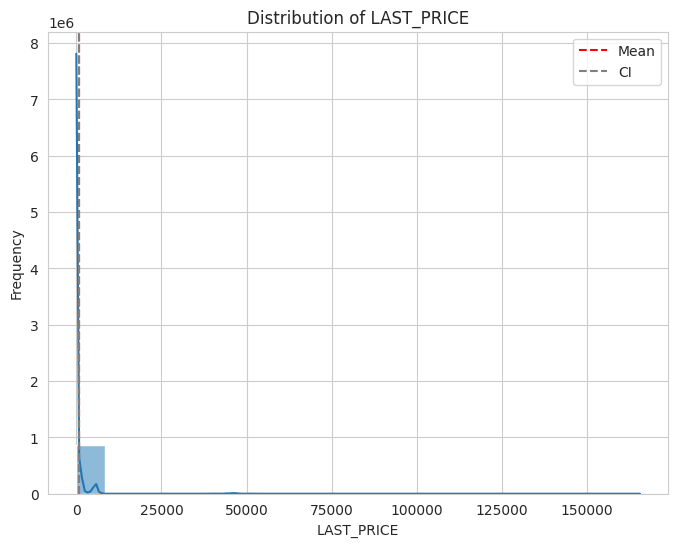

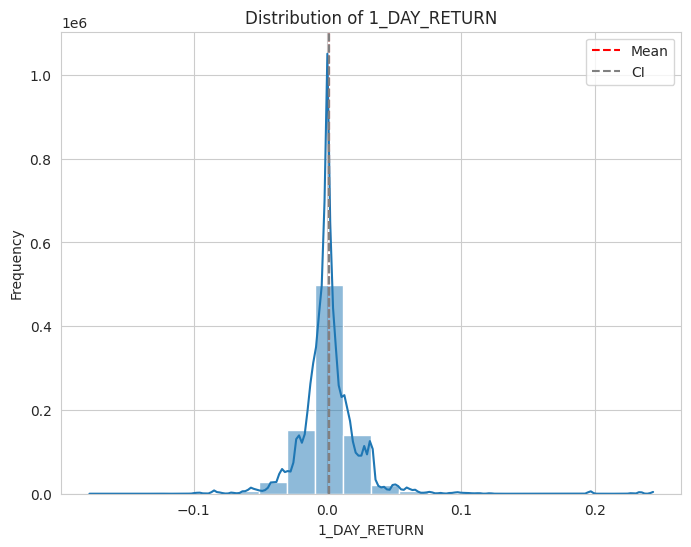

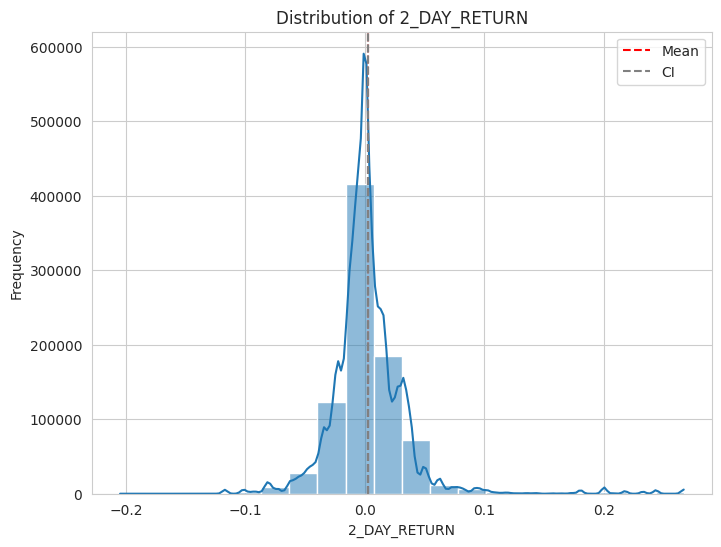

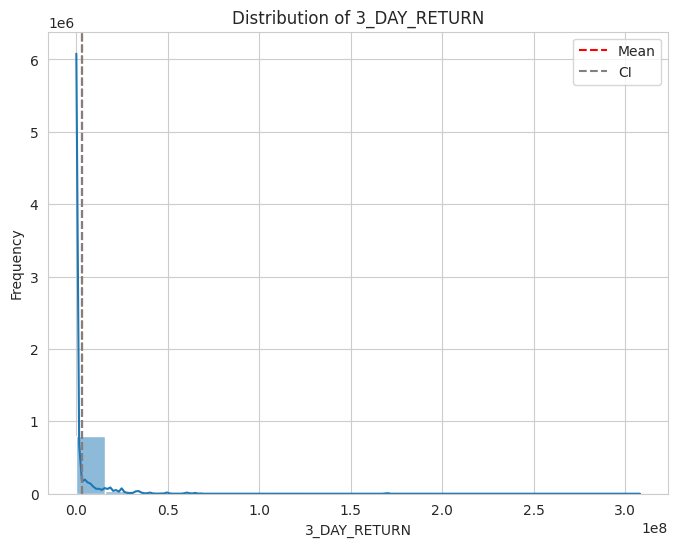

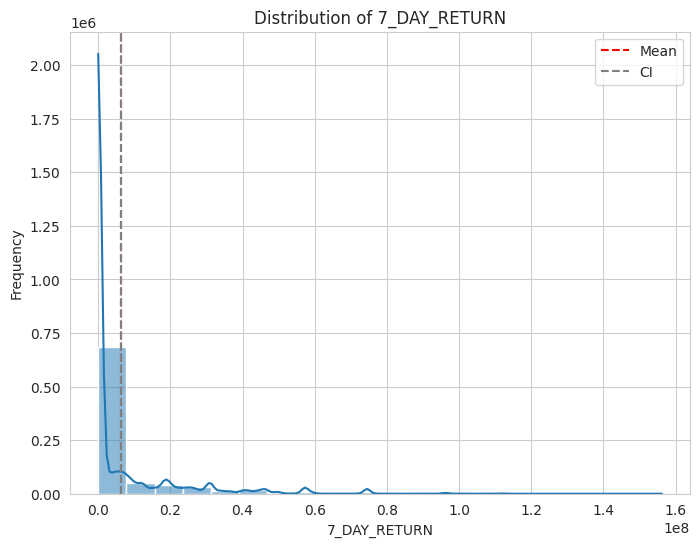

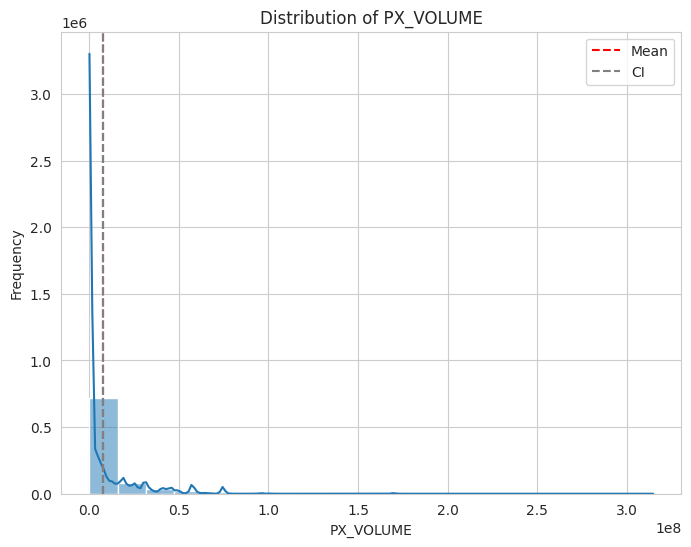

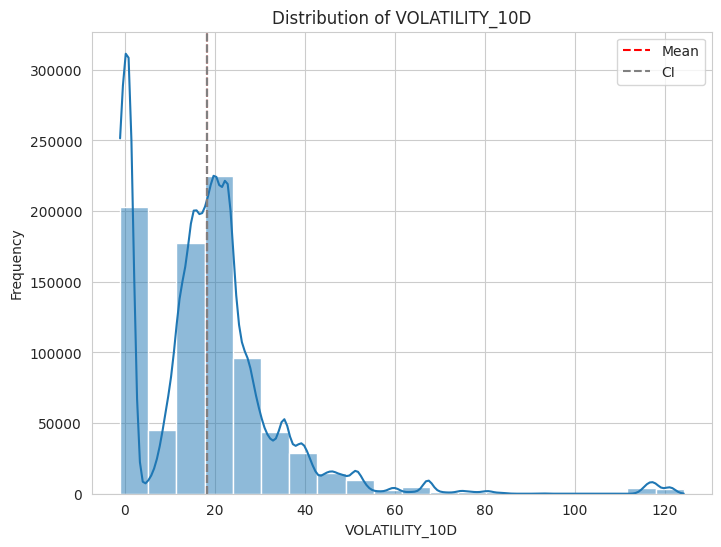

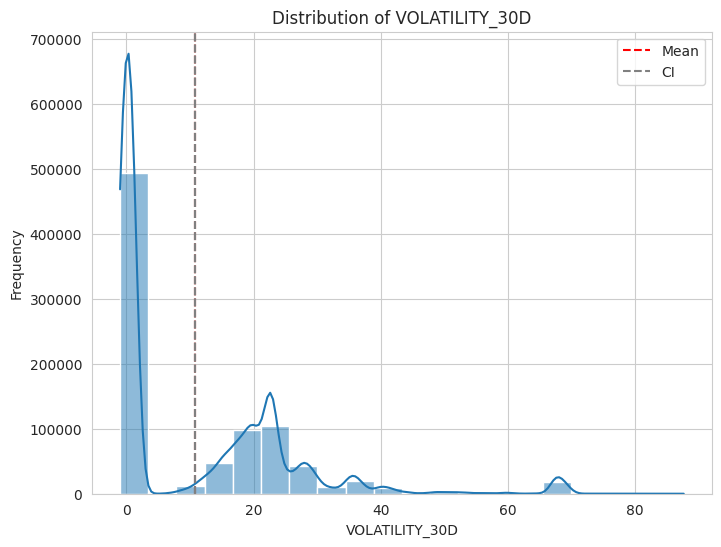

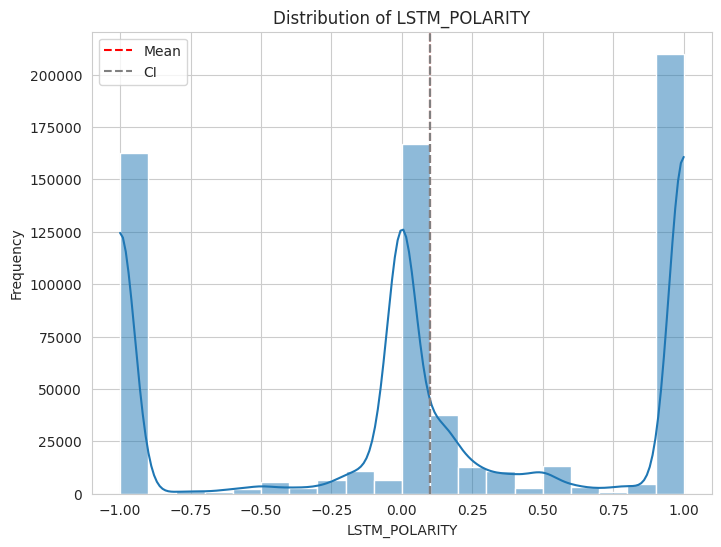

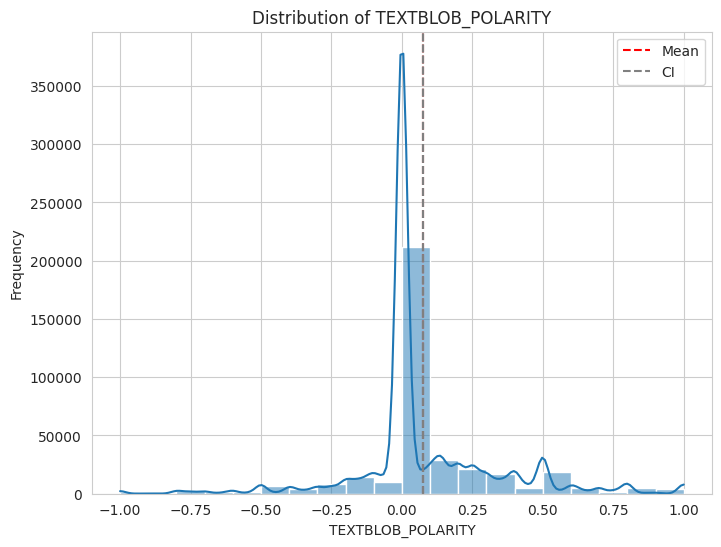

In [ ]:
# Histograms with Confidence Intervals
for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[feature], bins=20, kde=True)  # Histogram with KDE
    plt.title(f"Distribution of {feature}")
    plt.xlabel(feature)
    plt.ylabel("Frequency")

    # Calculate and plot confidence interval
    mean = df[feature].mean()
    std = df[feature].std()
    ci = 1.96 * std / np.sqrt(len(df))  # 95% CI
    plt.axvline(mean, color='red', linestyle='--', label='Mean')
    plt.axvline(mean - ci, color='gray', linestyle='--', label='CI')
    plt.axvline(mean + ci, color='gray', linestyle='--')
    plt.legend()

    plt.show()


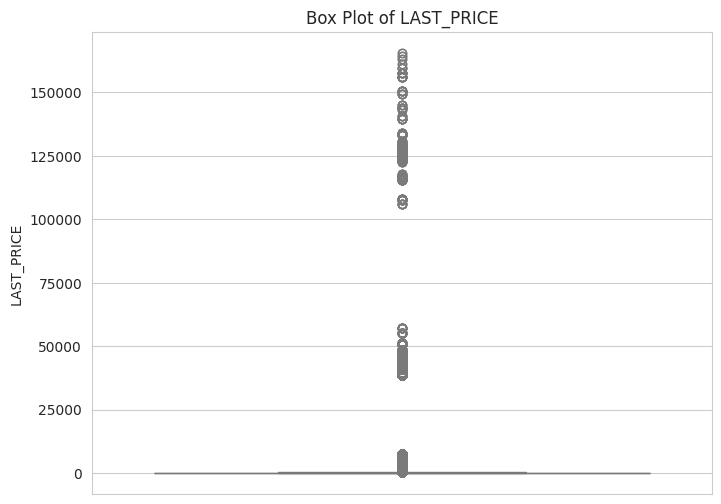

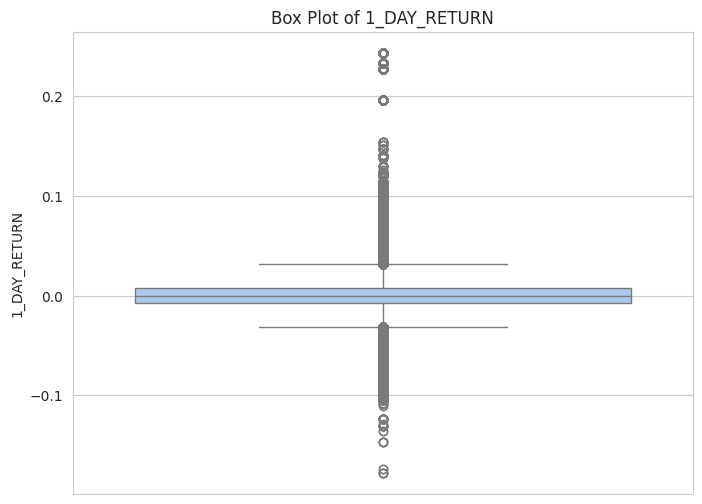

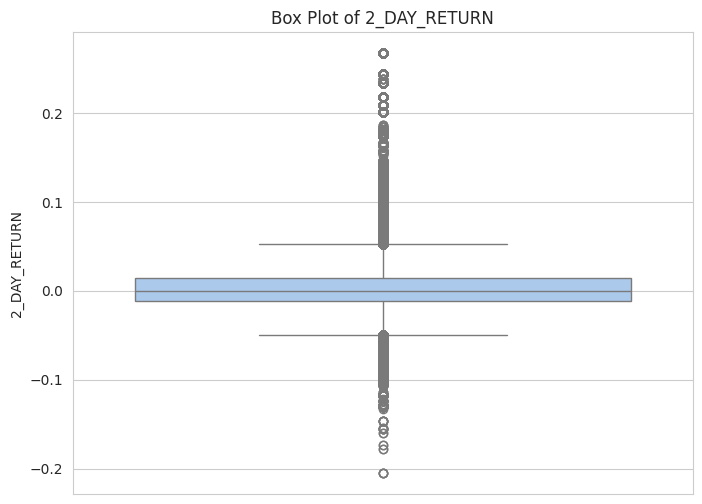

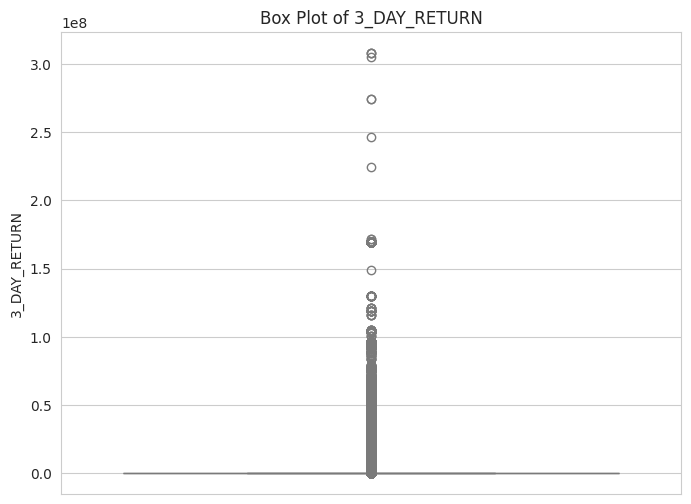

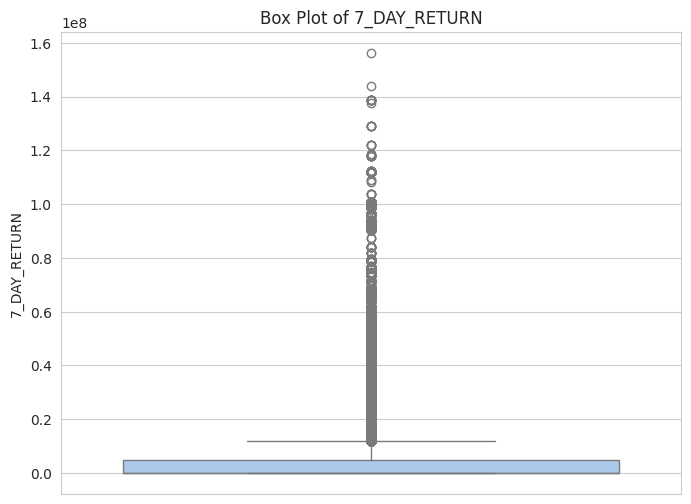

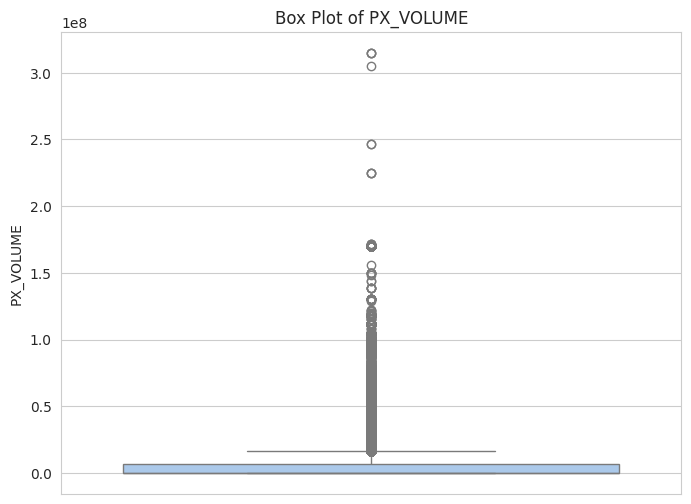

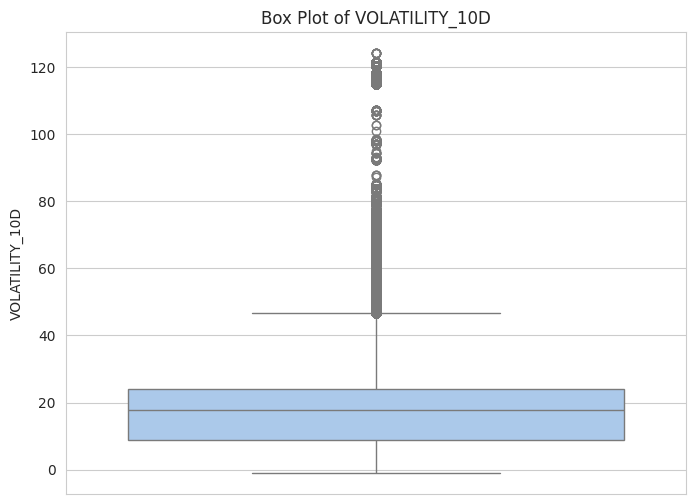

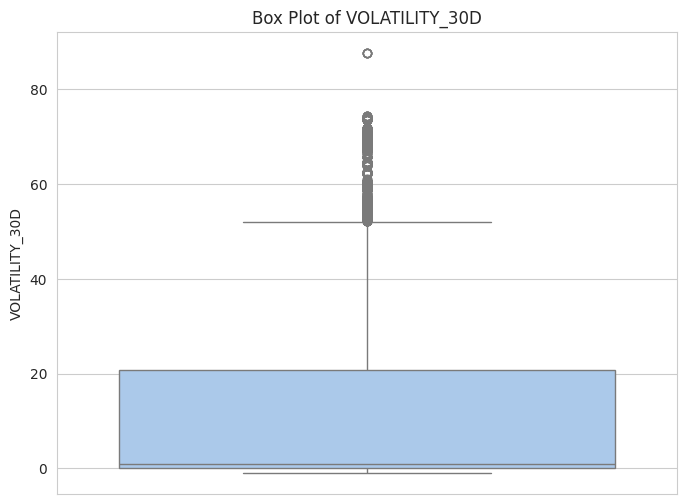

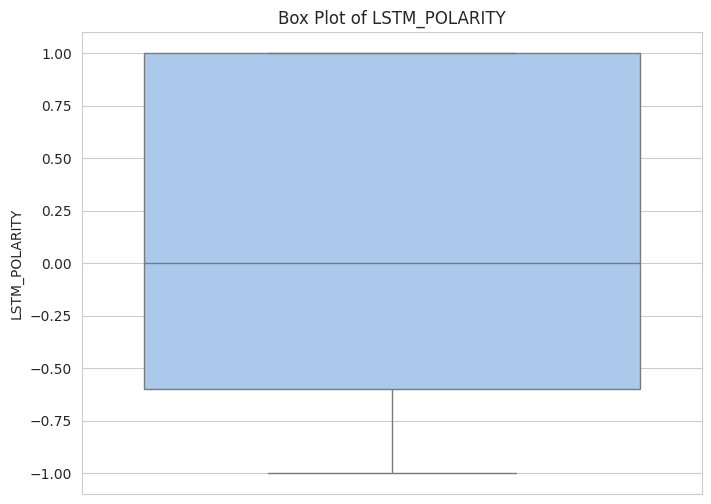

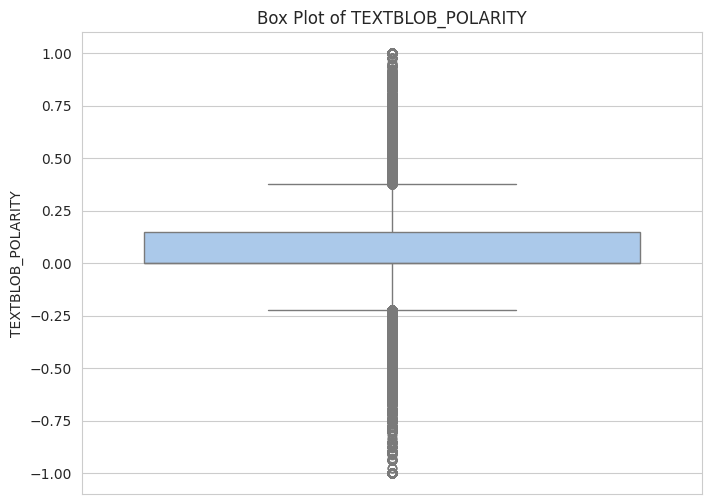

In [ ]:
sns.set_style("whitegrid") 
for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(y=df[feature], palette="pastel") 
    plt.title(f"Box Plot of {feature}")
    plt.ylabel(feature)
    plt.show()

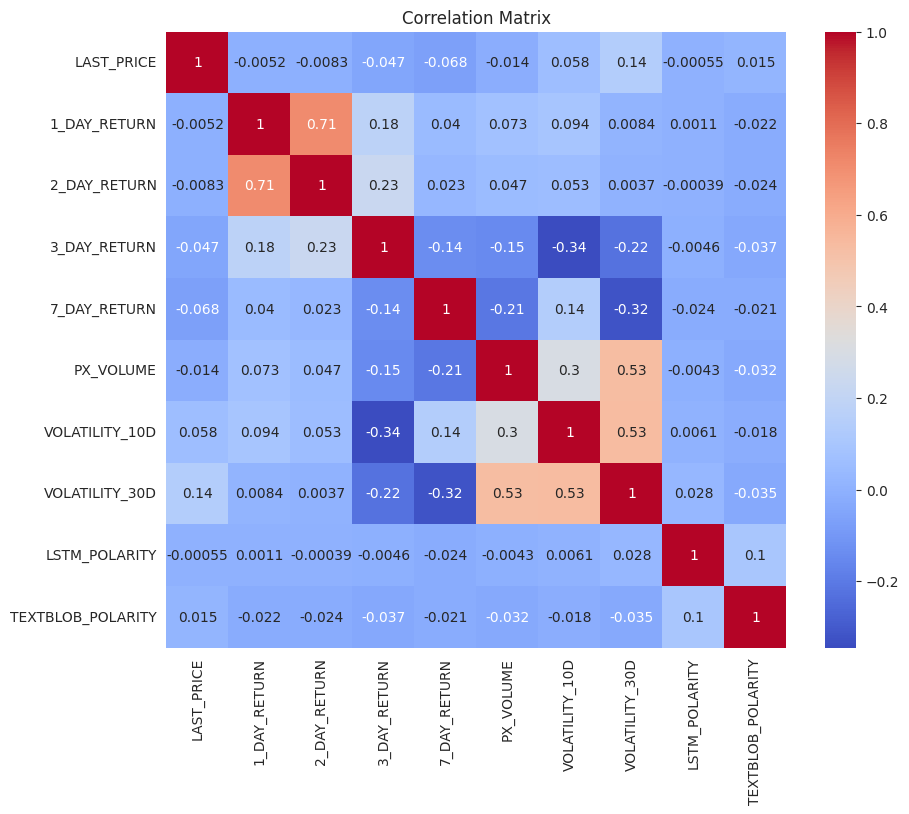

In [ ]:
correlation_matrix = df.corr(numeric_only=True)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

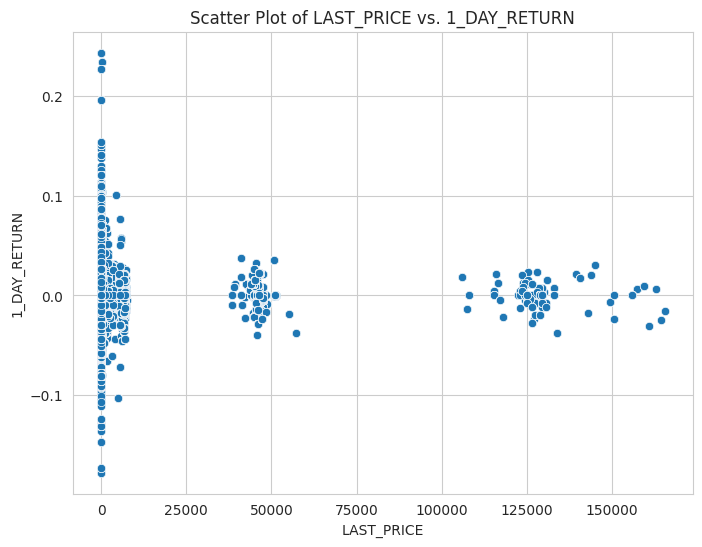

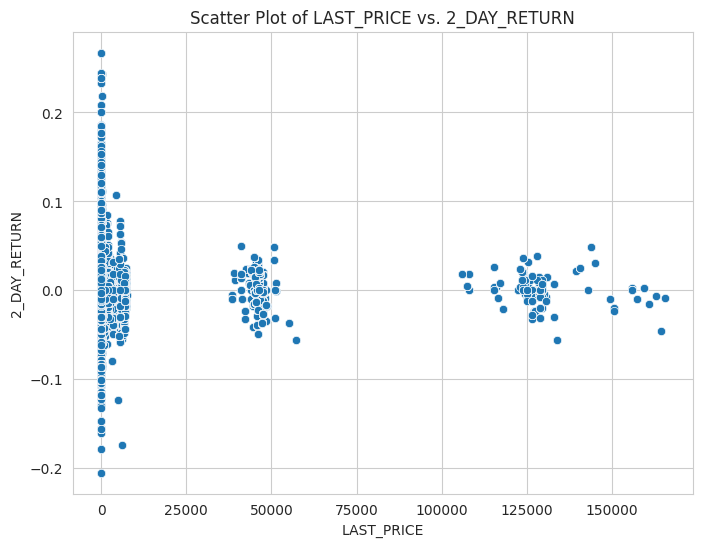

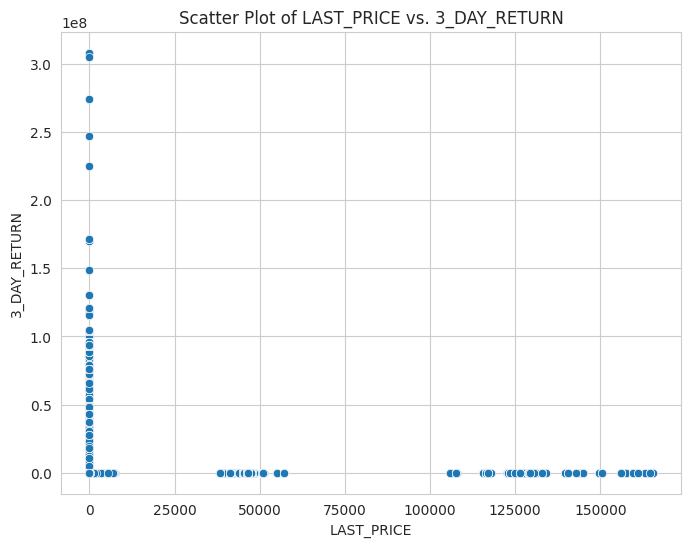

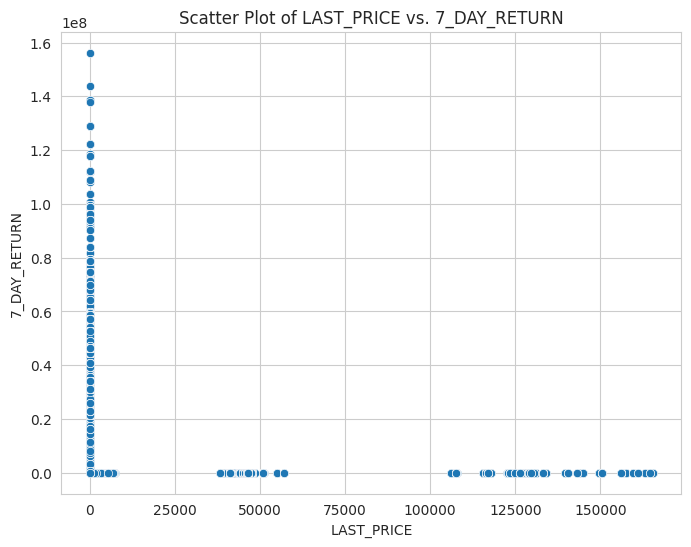

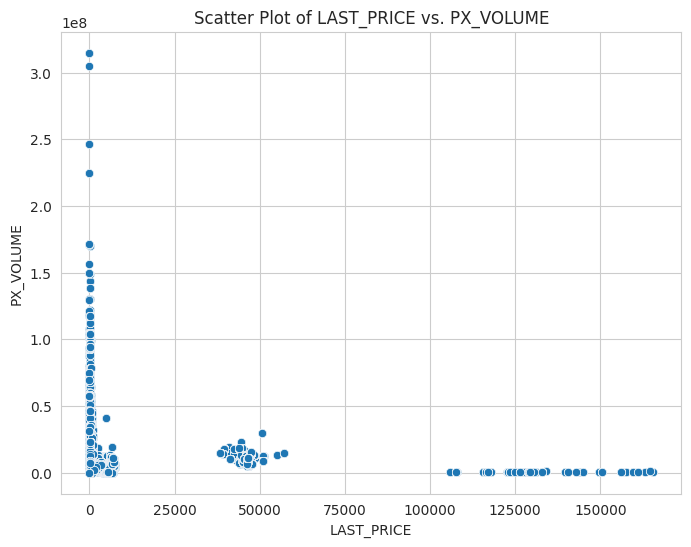

...

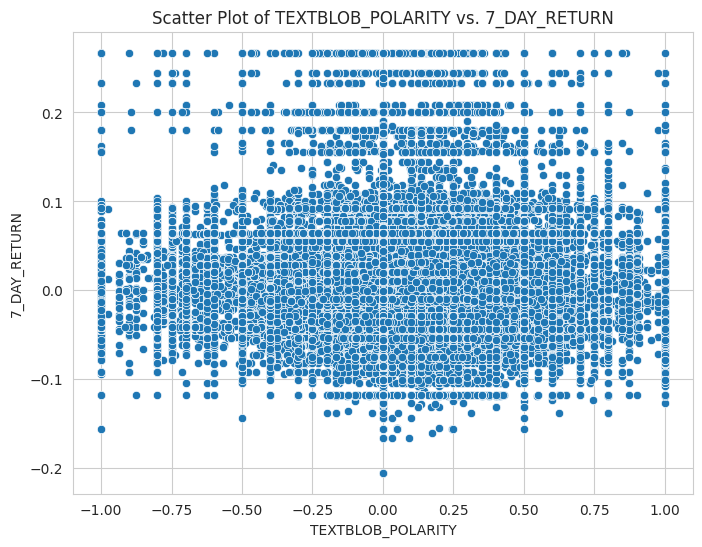

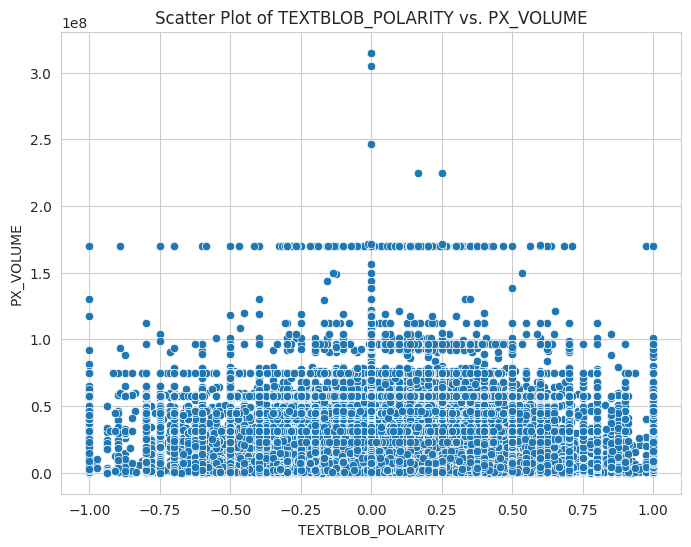

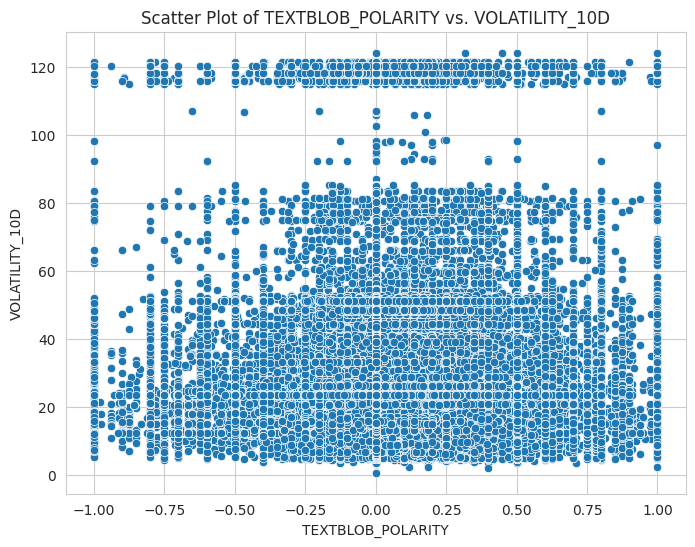

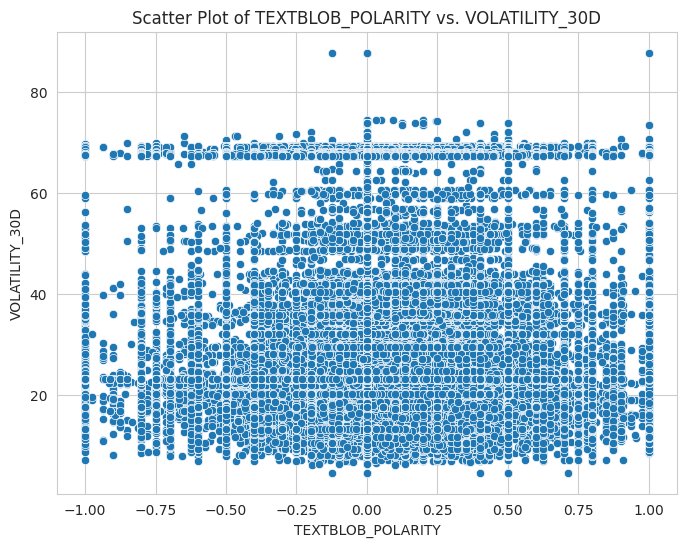

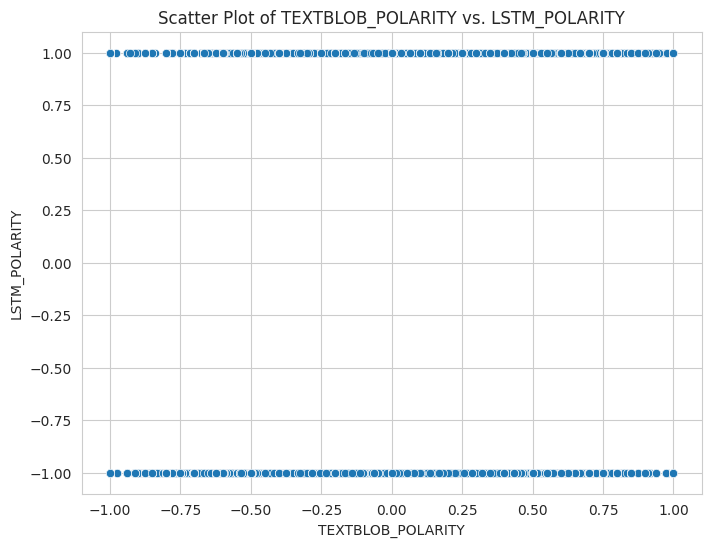

In [ ]:
# Looping through pairs of numerical features for scatter plots
for feature1 in numerical_features:
    for feature2 in numerical_features:
        if feature1 != feature2:  # Avoid plotting a feature against itself
            plt.figure(figsize=(8, 6))
            sns.scatterplot(x=df[feature1], y=df[feature2])  # Create scatter plot
            plt.title(f"Scatter Plot of {feature1} vs. {feature2}")
            plt.xlabel(feature1)
            plt.ylabel(feature2)
            plt.show()

In [ ]:
import missingno as msno  
numerical_features = df.select_dtypes(include=np.number).columns
missing_percentage = df[numerical_features].isnull().mean() * 100
print("Percentage of missing values in numerical columns:\n", missing_percentage)


Percentage of missing values in numerical columns:
 LAST_PRICE           38.211258
1_DAY_RETURN         38.211258
2_DAY_RETURN         38.211258
3_DAY_RETURN         38.211258
7_DAY_RETURN         38.211258
PX_VOLUME            38.211258
VOLATILITY_10D       38.218496
VOLATILITY_30D       38.214626
LSTM_POLARITY        52.624458
TEXTBLOB_POLARITY    73.652585
dtype: float64


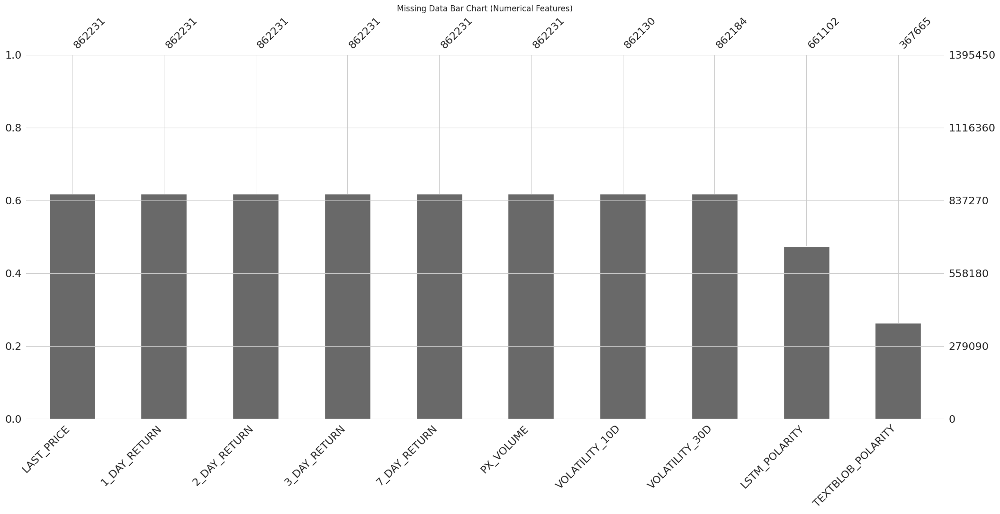

In [ ]:
msno.bar(df[numerical_features])
plt.title("Missing Data Bar Chart (Numerical Features)")
plt.show()


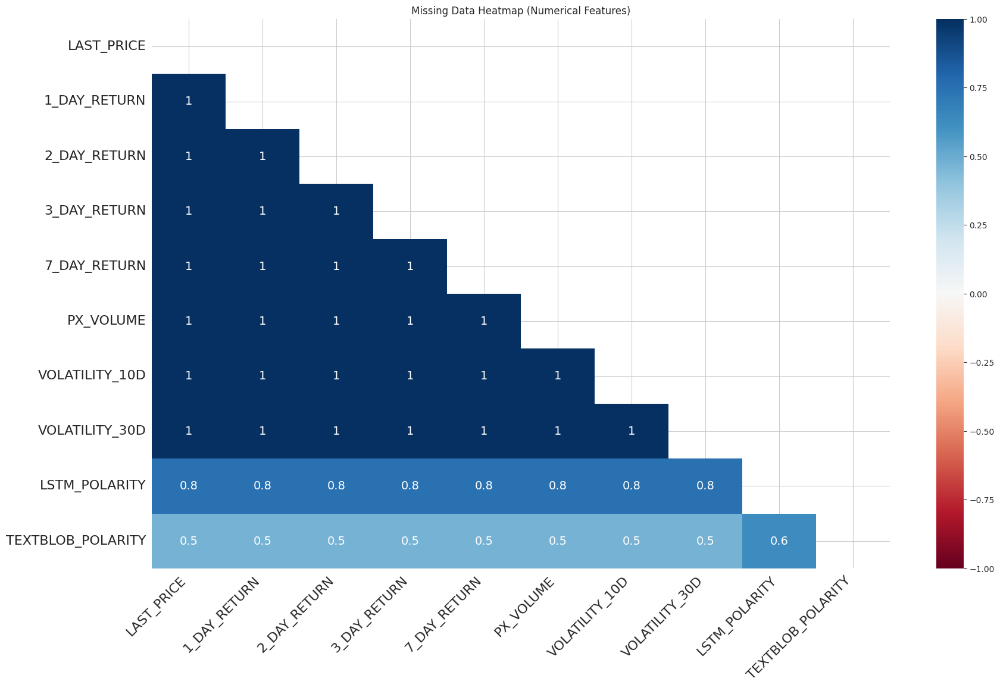

In [ ]:
msno.heatmap(df[numerical_features])
plt.title("Missing Data Heatmap (Numerical Features)")
plt.show()


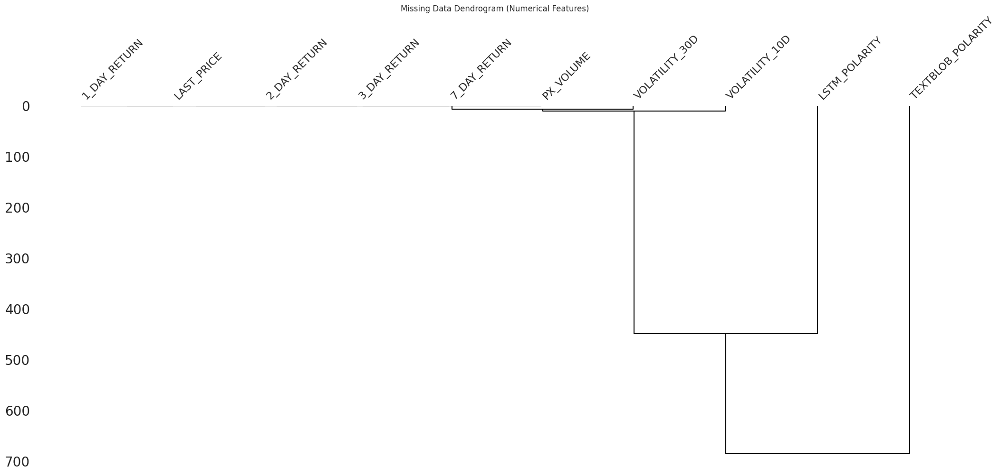

In [ ]:
msno.dendrogram(df[numerical_features])
plt.title("Missing Data Dendrogram (Numerical Features)")
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1395450 entries, 0 to 1395449
Data columns (total 14 columns):
 #   Column             Non-Null Count    Dtype  
---  ------             --------------    -----  
 0   Unnamed: 0         1102013 non-null  object 
 1   TWEET              1395398 non-null  object 
 2   STOCK              862231 non-null   object 
 3   DATE               862231 non-null   object 
 4   LAST_PRICE         862231 non-null   float64
 5   1_DAY_RETURN       862231 non-null   float64
 6   2_DAY_RETURN       862231 non-null   float64
 7   3_DAY_RETURN       862231 non-null   float64
 8   7_DAY_RETURN       862231 non-null   float64
 9   PX_VOLUME          862231 non-null   float64
 10  VOLATILITY_10D     862130 non-null   float64
 11  VOLATILITY_30D     862184 non-null   float64
 12  LSTM_POLARITY      661102 non-null   float64
 13  TEXTBLOB_POLARITY  367665 non-null   float64
dtypes: float64(10), object(4)
memory usage: 149.1+ MB


In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from tqdm import tqdm

# Initialize VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Function to get VADER polarity score
def get_vader_polarity(text):
    if pd.notnull(text):  # Check if tweet is not NaN
        return analyzer.polarity_scores(text)['compound']  # Returns sentiment score (-1 to 1)
    return None  # Return None for missing values

# Enable tqdm progress bar for pandas
tqdm.pandas()

# Apply VADER with a progress bar
df['VADER_POLARITY'] = df['TWEET'].progress_apply(get_vader_polarity)

# Display results
df[['TWEET', 'VADER_POLARITY']].head()

100%|██████████| 1395450/1395450 [01:52<00:00, 12351.91it/s]


,TWEET,VADER_POLARITY
0,RT @robertoglezcano: @amazon #Patents Show Fl...,0.1779
1,Amazon,0.1779
2,@FAME95FM1 Jamaicans make money with @Payoneer...,0.0000
3,@CBSi Jamaicans make money with @Payoneer @Pay...,0.0000
4,@Hitz92fm Jamaicans make money with @Payoneer ...,0.0000


In [ ]:
from textblob import TextBlob

# Function to calculate TextBlob polarity
def get_textblob_polarity(text):
    if pd.notnull(text):
        return TextBlob(text).sentiment.polarity  # Returns a score between -1 and 1
    return None

# Apply TextBlob with a progress bar
tqdm.pandas()  # Enable progress bar for pandas
df['TEXTBLOB_POLARITY'] = df['TWEET'].progress_apply(get_textblob_polarity)

# Display results
df[['TWEET', 'TEXTBLOB_POLARITY']].head()

100%|██████████| 1395450/1395450 [06:17<00:00, 3700.25it/s]


,TWEET,TEXTBLOB_POLARITY
0,RT @robertoglezcano: @amazon #Patents Show Fl...,0.0
1,Amazon,0.0
2,@FAME95FM1 Jamaicans make money with @Payoneer...,0.0
3,@CBSi Jamaicans make money with @Payoneer @Pay...,0.0
4,@Hitz92fm Jamaicans make money with @Payoneer ...,0.0


In [ ]:
df['risk_adjusted_return_1d'] = df['1_DAY_RETURN'] / (df['VOLATILITY_10D'] + 1e-6)
df['risk_adjusted_return_7d'] = df['7_DAY_RETURN'] / (df['VOLATILITY_30D'] + 1e-6)


In [ ]:
df['avg_sentiment'] = (df['LSTM_POLARITY'] + df['TEXTBLOB_POLARITY'] + df['VADER_POLARITY']) / 3


In [ ]:
df = df.dropna(subset=['1_DAY_RETURN'])
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 862231 entries, 1 to 1395449
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         568794 non-null  object 
 1   TWEET              862231 non-null  object 
 2   STOCK              862231 non-null  object 
 3   DATE               862231 non-null  object 
 4   LAST_PRICE         862231 non-null  float64
 5   1_DAY_RETURN       862231 non-null  float64
 6   2_DAY_RETURN       862231 non-null  float64
 7   3_DAY_RETURN       862231 non-null  float64
 8   7_DAY_RETURN       862231 non-null  float64
 9   PX_VOLUME          862231 non-null  float64
 10  VOLATILITY_10D     862130 non-null  float64
 11  VOLATILITY_30D     862184 non-null  float64
 12  LSTM_POLARITY      661102 non-null  float64
 13  TEXTBLOB_POLARITY  862231 non-null  float64
 14  VADER_POLARITY     862231 non-null  float64
dtypes: float64(11), object(4)
memory usage: 105.3+ MB


In [ ]:
df.shape

(862231, 15)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 862231 entries, 1 to 1395449
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         568794 non-null  object 
 1   TWEET              862231 non-null  object 
 2   STOCK              862231 non-null  object 
 3   DATE               862231 non-null  object 
 4   LAST_PRICE         862231 non-null  float64
 5   1_DAY_RETURN       862231 non-null  float64
 6   2_DAY_RETURN       862231 non-null  float64
 7   3_DAY_RETURN       862231 non-null  float64
 8   7_DAY_RETURN       862231 non-null  float64
 9   PX_VOLUME          862231 non-null  float64
 10  VOLATILITY_10D     862130 non-null  float64
 11  VOLATILITY_30D     862184 non-null  float64
 12  LSTM_POLARITY      661102 non-null  float64
 13  TEXTBLOB_POLARITY  862231 non-null  float64
 14  VADER_POLARITY     862231 non-null  float64
dtypes: float64(11), object(4)
memory usage: 105.3+ MB


In [ ]:
df.sample(100)

,Unnamed: 0,TWEET,STOCK,DATE,LAST_PRICE,1_DAY_RETURN,2_DAY_RETURN,3_DAY_RETURN,7_DAY_RETURN,PX_VOLUME,VOLATILITY_10D,VOLATILITY_30D,LSTM_POLARITY,TEXTBLOB_POLARITY,VADER_POLARITY
702943,Facebook,07/08/2018,183.81,0.010227952777324386,-0.032806,-0.032806,-0.061096,3.339856e+07,1.202730e+02,6.908700e+01,1.000,-0.300000,NaN,0.000000,0.0000
430022,NaN,Netflix,30/09/2017,181.35,0.000000,-0.003584,0.003419,3.308519e-02,4.227864e+06,3.104100e+01,25.357,-1.000000,-0.250000,0.000000,0.0000
1327656,NaN,Ford,26/09/2018,9.27,0.012945,0.034520,0.062567,5.501618e-02,5.859749e+07,2.522700e+01,23.103,-1.000000,0.000000,0.000000,0.0000
543658,Amazon,22/07/2018,1813.7,0.0,0.000000,-0.000402,-0.000369,3.891566e+06,1.729500e+01,1.965900e+01,1.000,0.666667,NaN,0.000000,0.0000
944229,566133,RT @charlieINTEL: If you’re having issues with...,Microsoft,29/08/2018,112.020000,-0.015711,-0.021603,-3.231566e-02,-4.427781e-02,2.081804e+07,13.129,18.558000,-1.000000,0.225000,-0.2960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170201,NaN,Apple,20/10/2018,219.31,0.000000,-0.015002,0.008572,1.276732e-02,3.307873e+07,4.210000e+01,29.662,1.000000,0.000000,0.000000,0.0000
1369411,NaN,Google,28/09/2018,1207.08,0.000232,-0.010786,-0.010927,-2.896245e-02,1.780759e+06,1.500500e+01,17.588,-1.000000,0.136364,0.000000,0.0000
816145,503729,RT @LuxuryTaxBrand: adidas Originals Californi...,adidas,18/08/2018,207.400000,0.000000,0.006750,-5.303761e-03,-9.643202e-03,5.060970e+05,46.499,29.209000,1.000000,0.244444,0.5562
749954,Facebook,11/08/2018,180.26,0.0,0.015700,0.027294,-0.013758,2.150041e+07,3.136500e+01,6.915000e+01,-1.000,0.037500,NaN,0.000000,0.0000


In [ ]:
import string
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import spacy

# Download necessary NLTK resources
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt_tab')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [ ]:
# Initialize lemmatizer and stopwords
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

# Load spaCy for additional cleaning (if needed)
nlp = spacy.load('en_core_web_sm')

In [ ]:
# Function to clean text
def clean_text(text):
    if pd.isnull(text):
        return ""

    # Convert text to lowercase
    text = text.lower()

    # Tokenize text
    tokens = word_tokenize(text)

    # Remove punctuation and stopwords, and lemmatize
    cleaned_tokens = [
        lemmatizer.lemmatize(word) for word in tokens
        if word not in stop_words and word not in string.punctuation
    ]

    # Reconstruct cleaned text
    cleaned_text = ' '.join(cleaned_tokens)

    return cleaned_text

In [ ]:
tqdm.pandas()

# Apply cleaning function to the 'TWEET' column with a progress bar
df['CLEANED_TWEET'] = df['TWEET'].progress_apply(clean_text)

# Display first few rows of the cleaned data
df[['TWEET', 'CLEANED_TWEET']].head()

100%|██████████| 862231/862231 [02:49<00:00, 5081.80it/s]


,TWEET,CLEANED_TWEET
1,Amazon,amazon
2,@FAME95FM1 Jamaicans make money with @Payoneer...,fame95fm1 jamaican make money payoneer paypal ...
3,@CBSi Jamaicans make money with @Payoneer @Pay...,cbsi jamaican make money payoneer paypal paxum...
4,@Hitz92fm Jamaicans make money with @Payoneer ...,hitz92fm jamaican make money payoneer paypal p...
6,Amazon,amazon


In [ ]:
# Function to check if a tweet has more than one meaningful word
def has_meaningful_words(text):
    # Tokenize the text
    tokens = word_tokenize(text)

    # Remove punctuation and convert to lowercase
    tokens = [word.lower() for word in tokens if word not in string.punctuation]

    # Filter out stop words
    meaningful_words = [word for word in tokens if word not in stop_words]

    # Return True if there are meaningful words and the number of meaningful words is greater than 1
    return len(meaningful_words) > 1

# Enable tqdm progress bar for pandas
tqdm.pandas()

# Drop rows where 'CLEANED_TWEET' has no meaningful words or contains only one meaningful word
df = df[df['CLEANED_TWEET'].progress_apply(has_meaningful_words)]

# Display first few rows of the cleaned data
df[['TWEET', 'CLEANED_TWEET']].head()

100%|██████████| 862231/862231 [01:22<00:00, 10469.03it/s]


,TWEET,CLEANED_TWEET
2,@FAME95FM1 Jamaicans make money with @Payoneer...,fame95fm1 jamaican make money payoneer paypal ...
3,@CBSi Jamaicans make money with @Payoneer @Pay...,cbsi jamaican make money payoneer paypal paxum...
4,@Hitz92fm Jamaicans make money with @Payoneer ...,hitz92fm jamaican make money payoneer paypal p...
11,"RT @nikitakhara: Thank you, @Starbucks CEO for...",rt nikitakhara thank starbucks ceo committing ...
20,@gawker Jamaicans make money with @Payoneer @P...,gawker jamaican make money payoneer paypal pax...


In [ ]:
df.shape

(371297, 21)

In [ ]:
df.sample(100)

,Unnamed: 0,TWEET,STOCK,DATE,LAST_PRICE,1_DAY_RETURN,2_DAY_RETURN,3_DAY_RETURN,7_DAY_RETURN,PX_VOLUME,...,VOLATILITY_30D,LSTM_POLARITY,TEXTBLOB_POLARITY,VADER_POLARITY,risk_adjusted_return_1d,risk_adjusted_return_7d,avg_sentiment,sentiment_momentum,CLEANED_TWEET,TOKENIZED_TWEET
642836,391815,@shanedawson should have a show. Or at the ver...,Netflix,02/08/2018,344.50,-0.017765,-0.020464,-0.027692,0.053962,7131328.0,...,42.050,-1.0,-0.195000,-0.4019,-0.000462,0.001283,-0.532300,-1.057833,shanedawson show least netflix documentary ser...,"[shanedawson, show, least, netflix, documentar..."
699974,429011,RT @kwilli1046: The Leftist Assault on the Mid...,Facebook,07/08/2018,183.81,0.010228,-0.032806,-0.032806,-0.061096,33398562.0,...,69.087,1.0,-0.050000,-0.7783,0.000085,-0.000884,0.057233,NaN,rt kwilli1046 leftist assault mid-term electio...,"[rt, kwilli1046, leftist, assault, mid-term, e..."
1039305,627457.0,RT @thedonholly: If you plan on boycotting Nik...,Nike,05/09/2018,79.92,-0.004004,0.028529,0.028529,0.035911,12269138.0,...,19.239,-1.0,0.400000,0.3254,-0.000190,0.001867,-0.091533,-0.044311,rt thedonholly plan boycotting nike dispose cl...,"[rt, thedonholly, plan, boycotting, nike, disp..."
614198,373667,"@AmazonHelp It’s been 4 Days, I completed the ...",Amazon,31/07/2018,1777.44,0.001001,0.022409,0.022409,0.029143,5738713.0,...,23.757,1.0,0.000000,0.2960,0.000038,0.001227,0.432000,NaN,amazonhelp ’ 4 day completed form asked still ...,"[amazonhelp, ’, 4, day, completed, form, asked..."
975704,586919,RT @EXOXOXOID: 180910 SMTOWN Station Facebook....,Facebook,10/09/2018,164.18,-0.006944,-0.006944,-0.006944,0.070350,20197680.0,...,25.475,1.0,0.000000,0.0000,-0.000296,0.002762,0.333333,0.418667,rt exoxoxoid 180910 smtown station facebook se...,"[rt, exoxoxoid, 180910, smtown, station, faceb..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
522393,315031,"JUST LISTED: ""2014 Ford Fusion""https://t.co/X...",Ford,18/07/2018,10.87,-0.000920,-0.001840,0.010120,0.018399,36420018.0,...,13.190,-1.0,0.000000,0.0000,-0.000066,0.001395,-0.333333,-0.059811,listed `` 2014 ford fusion '' http //t.co/xp8y...,"[listed, ``, 2014, ford, fusion, ``, http, //t..."
629297,383218,"Deliver professional, large scale live events ...",Microsoft,01/08/2018,106.28,-0.001882,-0.008562,0.013173,0.042811,23628699.0,...,20.827,1.0,0.150216,0.3612,-0.000068,0.002056,0.503805,NaN,deliver professional large scale live event ea...,"[deliver, professional, large, scale, live, ev..."
1267277,776396.0,"RT @EmKuhn29: @EdWhelanEPPC Hey Ed, Christine ...",Ford,22/09/2018,9.85,0.000000,-0.004061,-0.007107,-0.040609,74488637.0,...,22.242,1.0,0.000000,0.0000,0.000000,-0.001826,0.333333,0.333333,rt emkuhn29 edwhelaneppc hey ed christine ford...,"[rt, emkuhn29, edwhelaneppc, hey, ed, christin..."
191019,116487,RT @BTS_twt: RM - mono.\r\r\r\r\r\r\n\r\r\r\r\...,Google,22/10/2018,1111.37,-0.005570,-0.005570,-0.005570,-0.008035,1355842.0,...,25.831,1.0,0.000000,0.0000,-0.000142,-0.000311,0.333333,0.000000,rt bts_twt rm mono soundcloud http //t.co/lre5...,"[rt, bts_twt, rm, mono, soundcloud, http, //t...."


In [ ]:
# Drop the specified columns
df = df.drop(columns=['Unnamed: 0', 'TWEET'])


In [ ]:
from nltk.tokenize import word_tokenize

def tokenize_tweet(tweet):
    if pd.isnull(tweet) or tweet == "":
        return []  # Return an empty list for empty or missing tweets
    return word_tokenize(tweet)

# Apply the tokenizer to the CLEANED_TWEET column
df['TOKENIZED_TWEET'] = df['CLEANED_TWEET'].apply(tokenize_tweet)

# Display the first few rows with tokenized tweets
df[['CLEANED_TWEET', 'TOKENIZED_TWEET']].head()


,CLEANED_TWEET,TOKENIZED_TWEET
2,fame95fm1 jamaican make money payoneer paypal ...,"[fame95fm1, jamaican, make, money, payoneer, p..."
3,cbsi jamaican make money payoneer paypal paxum...,"[cbsi, jamaican, make, money, payoneer, paypal..."
4,hitz92fm jamaican make money payoneer paypal p...,"[hitz92fm, jamaican, make, money, payoneer, pa..."
11,rt nikitakhara thank starbucks ceo committing ...,"[rt, nikitakhara, thank, starbucks, ceo, commi..."
20,gawker jamaican make money payoneer paypal pax...,"[gawker, jamaican, make, money, payoneer, payp..."


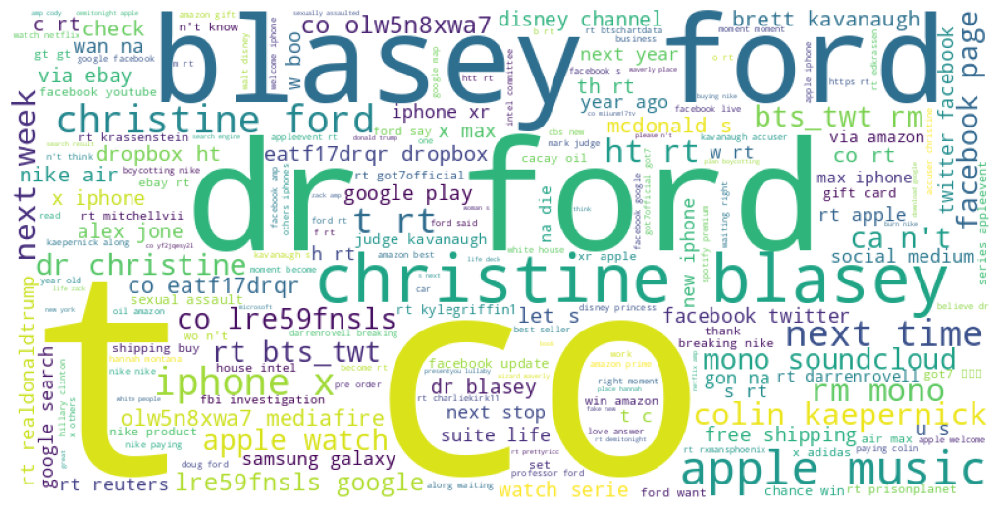

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine all cleaned tweets into a single string
all_words = ' '.join(df['CLEANED_TWEET'])

# Create a WordCloud object
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)

# Display the generated image:
plt.figure(figsize=(10, 5), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()


In [ ]:
from nltk.probability import FreqDist
from collections import Counter
from itertools import chain

# Calculate word frequencies
# Flatten the list of tokenized tweets into a single iterable
all_tokens = chain.from_iterable(df['TOKENIZED_TWEET'])

# Create a Counter from the flattened list
word_frequencies = Counter(all_tokens)

# Get the most common words
most_common_words = word_frequencies.most_common(20) 
most_common_words

[('rt', 265599),
 ('http', 206516),
 ('``', 86247),
 ('’', 60584),
 ('ford', 55484),
 ('facebook', 49687),
 ("'s", 41813),
 ('next', 36743),
 ('google', 36679),
 ('apple', 33788),
 ('nike', 33295),
 ('amazon', 27149),
 ('amp', 26069),
 ('netflix', 19996),
 ('new', 18277),
 ('dr.', 16508),
 ('like', 16451),
 ("n't", 16197),
 ('“', 16018),
 ('...', 15753)]

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 367663 entries, 2 to 1395443
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   STOCK              367663 non-null  object        
 1   DATE               367663 non-null  datetime64[ns]
 2   LAST_PRICE         367663 non-null  float64       
 3   1_DAY_RETURN       367663 non-null  float64       
 4   2_DAY_RETURN       367663 non-null  float64       
 5   3_DAY_RETURN       367663 non-null  float64       
 6   7_DAY_RETURN       367663 non-null  float64       
 7   PX_VOLUME          367663 non-null  float64       
 8   VOLATILITY_10D     367663 non-null  float64       
 9   VOLATILITY_30D     367618 non-null  float64       
 10  LSTM_POLARITY      367663 non-null  float64       
 11  TEXTBLOB_POLARITY  367663 non-null  float64       
 12  VADER_POLARITY     367663 non-null  float64       
 13  CLEANED_TWEET      367663 non-null  object      

In [ ]:
print(df['STOCK'].nunique())


101


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 367663 entries, 0 to 367662
Data columns (total 15 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   STOCK              367663 non-null  object 
 1   DATE               367663 non-null  object 
 2   LAST_PRICE         367663 non-null  float64
 3   1_DAY_RETURN       367663 non-null  float64
 4   2_DAY_RETURN       367663 non-null  float64
 5   3_DAY_RETURN       367663 non-null  float64
 6   7_DAY_RETURN       367663 non-null  float64
 7   PX_VOLUME          367663 non-null  float64
 8   VOLATILITY_10D     367663 non-null  float64
 9   VOLATILITY_30D     367618 non-null  float64
 10  LSTM_POLARITY      367663 non-null  float64
 11  TEXTBLOB_POLARITY  367663 non-null  float64
 12  VADER_POLARITY     367663 non-null  float64
 13  CLEANED_TWEET      367663 non-null  object 
 14  TOKENIZED_TWEET    367663 non-null  object 
dtypes: float64(11), object(4)
memory usage: 42.1+ MB


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize TF-IDF Vectorizer
vectorizer = TfidfVectorizer(max_features=1000)  # Limit to top 5000 features 

# Fit and transform the text data
tfidf_embeddings = vectorizer.fit_transform(df['TOKENIZED_TWEET'].apply(lambda x: ' '.join(x)))

# Store as a new column
df['TFIDF_EMBEDDINGS'] = list(tfidf_embeddings.toarray())

# Display first few rows
df[['TOKENIZED_TWEET', 'TFIDF_EMBEDDINGS']].head()


,TOKENIZED_TWEET,TFIDF_EMBEDDINGS
2,"[fame95fm1, jamaican, make, money, payoneer, p...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,"[cbsi, jamaican, make, money, payoneer, paypal...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,"[hitz92fm, jamaican, make, money, payoneer, pa...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
11,"[rt, nikitakhara, thank, starbucks, ceo, commi...","[0.0, 0.3535448018038174, 0.34666688137188617,..."
20,"[gawker, jamaican, make, money, payoneer, payp...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 371297 entries, 2 to 1395443
Data columns (total 21 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   STOCK                    371297 non-null  object 
 1   DATE                     371297 non-null  object 
 2   LAST_PRICE               371297 non-null  float64
 3   1_DAY_RETURN             371297 non-null  float64
 4   2_DAY_RETURN             371297 non-null  float64
 5   3_DAY_RETURN             371297 non-null  float64
 6   7_DAY_RETURN             371297 non-null  float64
 7   PX_VOLUME                371297 non-null  float64
 8   VOLATILITY_10D           371297 non-null  float64
 9   VOLATILITY_30D           371252 non-null  float64
 10  LSTM_POLARITY            371297 non-null  float64
 11  TEXTBLOB_POLARITY        371297 non-null  float64
 12  VADER_POLARITY           371297 non-null  float64
 13  risk_adjusted_return_1d  371297 non-null  float64
 14  risk_adj

In [8]:
from sklearn.preprocessing import LabelEncoder

# Initialize label encoder
le = LabelEncoder()

# Encode STOCK column
df['STOCK_ENCODED'] = le.fit_transform(df['STOCK'])

In [ ]:
# Count NaN values in the entire DataFrame
nan_count = df.isnull().sum().sum()
print(f"Total number of NaN values in the DataFrame: {nan_count}")

# Count NaN values per column
nan_counts_per_column = df.isnull().sum()
print("\nNaN counts per column:\n", nan_counts_per_column)


Total number of NaN values in the DataFrame: 7391

NaN counts per column:
 STOCK                         0
DATE                          0
LAST_PRICE                    0
1_DAY_RETURN                  0
2_DAY_RETURN                  0
3_DAY_RETURN                  0
7_DAY_RETURN                  0
PX_VOLUME                     0
VOLATILITY_10D                0
VOLATILITY_30D                9
LSTM_POLARITY                 0
TEXTBLOB_POLARITY             0
VADER_POLARITY                0
risk_adjusted_return_1d       0
risk_adjusted_return_7d       9
avg_sentiment                 0
sentiment_momentum         7373
CLEANED_TWEET                 0
TOKENIZED_TWEET               0
TFIDF_EMBEDDINGS              0
EMBEDDINGS                    0
STOCK_ENCODED                 0
dtype: int64


In [ ]:
from sentence_transformers import SentenceTransformer

# Load the optimized small model for speed
model = SentenceTransformer('paraphrase-MiniLM-L6-v2')

# Function to generate embeddings in batches
def generate_batch_embeddings(texts_batch):
    return model.encode(texts_batch, batch_size=32, show_progress_bar=True)

# Apply in batches with tqdm
batch_size = 500  # Adjust based on memory
embeddings = []

# Wrapping the loop with tqdm for progress bar
for i in tqdm(range(0, len(df), batch_size), desc="Processing batches", unit="batch"):
    batch = df['CLEANED_TWEET'].iloc[i:i+batch_size].tolist()
    batch_embeddings = generate_batch_embeddings(batch)
    embeddings.append(batch_embeddings)

# Convert list of embeddings into a numpy array
embeddings_array = np.vstack(embeddings)  # Ensures the shape is correct

# Store in DataFrame as a list column (avoiding dimension errors)
df['EMBEDDINGS'] = list(embeddings_array)

# Display the first few rows with embeddings
df[['CLEANED_TWEET', 'EMBEDDINGS']].head()


Processing batches:   0%|          | 0/37 [00:00<?, ?batch/s]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:   3%|▎         | 1/37 [00:02<01:26,  2.41s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:   5%|▌         | 2/37 [00:03<01:03,  1.81s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:   8%|▊         | 3/37 [00:05<01:05,  1.91s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  11%|█         | 4/37 [00:07<01:00,  1.83s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  14%|█▎        | 5/37 [00:09<00:59,  1.85s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  16%|█▌        | 6/37 [00:11<01:00,  1.95s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  19%|█▉        | 7/37 [00:13<00:58,  1.94s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  22%|██▏       | 8/37 [00:15<00:55,  1.92s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  24%|██▍       | 9/37 [00:17<00:54,  1.96s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  27%|██▋       | 10/37 [00:19<00:53,  1.98s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  30%|██▉       | 11/37 [00:21<00:51,  1.98s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  32%|███▏      | 12/37 [00:23<00:50,  2.02s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  35%|███▌      | 13/37 [00:25<00:49,  2.04s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  38%|███▊      | 14/37 [00:27<00:47,  2.06s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  41%|████      | 15/37 [00:29<00:46,  2.10s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  43%|████▎     | 16/37 [00:32<00:44,  2.12s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  46%|████▌     | 17/37 [00:34<00:43,  2.15s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  49%|████▊     | 18/37 [00:36<00:40,  2.13s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  51%|█████▏    | 19/37 [00:38<00:38,  2.13s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  54%|█████▍    | 20/37 [00:40<00:36,  2.15s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  57%|█████▋    | 21/37 [00:42<00:34,  2.17s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  59%|█████▉    | 22/37 [00:45<00:32,  2.17s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  62%|██████▏   | 23/37 [00:47<00:30,  2.16s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  65%|██████▍   | 24/37 [00:49<00:28,  2.17s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  68%|██████▊   | 25/37 [00:51<00:26,  2.20s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  70%|███████   | 26/37 [00:53<00:24,  2.19s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  73%|███████▎  | 27/37 [00:56<00:22,  2.20s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  76%|███████▌  | 28/37 [00:58<00:19,  2.14s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  78%|███████▊  | 29/37 [01:00<00:16,  2.12s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  81%|████████  | 30/37 [01:02<00:14,  2.11s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  84%|████████▍ | 31/37 [01:04<00:12,  2.10s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  86%|████████▋ | 32/37 [01:06<00:10,  2.06s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  89%|████████▉ | 33/37 [01:08<00:08,  2.08s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  92%|█████████▏| 34/37 [01:10<00:06,  2.08s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  95%|█████████▍| 35/37 [01:12<00:04,  2.08s/batch]

Batches:   0%|          | 0/16 [00:00<?, ?it/s]

Processing batches:  97%|█████████▋| 36/37 [01:14<00:02,  2.08s/batch]

Batches:   0%|          | 0/10 [00:00<?, ?it/s]

Processing batches: 100%|██████████| 37/37 [01:15<00:00,  2.05s/batch]


,CLEANED_TWEET,EMBEDDINGS
0,fame95fm1 jamaican make money payoneer paypal ...,"[0.013366038, -0.09889232, -0.008595247, 0.290..."
1,cbsi jamaican make money payoneer paypal paxum...,"[-0.15163946, -0.35085076, 0.079003364, 0.0604..."
2,hitz92fm jamaican make money payoneer paypal p...,"[-0.21960156, -0.14359392, -0.22134428, 0.3641..."
3,rt nikitakhara thank starbucks ceo committing ...,"[-0.21587391, 0.0840044, 0.093082495, 0.297041..."
4,gawker jamaican make money payoneer paypal pax...,"[-0.21550553, -0.28742978, -0.15349181, 0.2529..."


In [ ]:
# Function to load GloVe embeddings
def load_glove_embeddings(glove_file_path):
    glove_embeddings = {}
    with open(glove_file_path, 'r', encoding='utf-8') as f:
        for line in f:
            values = line.split()
            word = values[0]
            embedding = np.asarray(values[1:], dtype='float32')
            glove_embeddings[word] = embedding
    return glove_embeddings

# Load GloVe embeddings (adjust the file path to where you extracted your GloVe file)
glove_file_path = 'glove.6B.100d.txt'  # Change this to your GloVe file
glove_embeddings = load_glove_embeddings(glove_file_path)

# Function to get sentence embedding by averaging word embeddings
def get_sentence_embedding(tokens, glove_embeddings, embedding_dim=100):
    word_embeddings = []
    
    for word in tokens:
        # If the word is in the GloVe dictionary, use its embedding
        if word in glove_embeddings:
            word_embeddings.append(glove_embeddings[word])
        else:
            # If the word is not found, append a zero vector (or skip)
            word_embeddings.append(np.zeros(embedding_dim))  # Assuming 50-dimensional GloVe embeddings
            
    # Compute the average embedding for the sentence
    if word_embeddings:
        return np.mean(word_embeddings, axis=0)
    else:
        return np.zeros(embedding_dim)  # Return zero vector if no valid words

#applying GloVe embeddings to a DataFrame of tokenized tweets
df['GLOVE_EMBEDDINGS'] = df['TOKENIZED_TWEET'].apply(lambda x: get_sentence_embedding(x, glove_embeddings))

# Display the first few embeddings
print(df[['TOKENIZED_TWEET', 'GLOVE_EMBEDDINGS']].head())


                                     TOKENIZED_TWEET  \
0  ['fame95fm1', 'jamaican', 'make', 'money', 'pa...   
1  ['cbsi', 'jamaican', 'make', 'money', 'payonee...   
2  ['hitz92fm', 'jamaican', 'make', 'money', 'pay...   
3  ['rt', 'nikitakhara', 'thank', 'starbucks', 'c...   
4  ['gawker', 'jamaican', 'make', 'money', 'payon...   

                                    GLOVE_EMBEDDINGS  
0  [-0.2669312299985904, 0.21988030016655102, 0.2...  
1  [-0.2581125483280275, 0.20979612620501983, 0.2...  
2  [-0.25586225334408247, 0.20683152407525093, 0....  
3  [-0.2700252115361757, 0.22786516297634665, 0.2...  
4  [-0.2868061400949955, 0.21294749957323075, 0.2...  


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18294 entries, 0 to 18293
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   DATE                     18294 non-null  object 
 1   LAST_PRICE               18294 non-null  float64
 2   1_DAY_RETURN             18294 non-null  float64
 3   2_DAY_RETURN             18294 non-null  float64
 4   3_DAY_RETURN             18294 non-null  float64
 5   7_DAY_RETURN             18294 non-null  float64
 6   PX_VOLUME                18294 non-null  float64
 7   VOLATILITY_10D           18294 non-null  float64
 8   VOLATILITY_30D           18294 non-null  float64
 9   LSTM_POLARITY            18294 non-null  float64
 10  TEXTBLOB_POLARITY        18294 non-null  float64
 11  VADER_POLARITY           18294 non-null  float64
 12  risk_adjusted_return_1d  18294 non-null  float64
 13  risk_adjusted_return_7d  18294 non-null  float64
 14  avg_sentiment         

In [10]:
df.sample(100)

,STOCK,DATE,LAST_PRICE,1_DAY_RETURN,2_DAY_RETURN,3_DAY_RETURN,7_DAY_RETURN,PX_VOLUME,VOLATILITY_10D,VOLATILITY_30D,...,VADER_POLARITY,risk_adjusted_return_1d,risk_adjusted_return_7d,avg_sentiment,sentiment_momentum,CLEANED_TWEET,TOKENIZED_TWEET,TFIDF_EMBEDDINGS,EMBEDDINGS,STOCK_ENCODED
13583,Reuters,04/09/2018,48.871000,0.003607,0.003607,0.003607,6.535573e-03,2.464463e+06,19.369,16.923,...,0.0000,0.000186,3.861947e-04,-0.333333,-0.378967,rt reuters labor day trump hit back largest un...,"['rt', 'reuters', 'labor', 'day', 'trump', 'hi...",[0. 0. 0. 0. 0...,"[-0.13219908, 0.08348788, 0.04990418, 0.718076...",96
5895,eBay,31/10/2017,37.640000,-0.017003,-0.022317,-0.022317,-2.391073e-02,6.722841e+06,19.794,16.127,...,0.0000,-0.000859,-1.482652e-03,-0.333333,-0.333333,check hospital nurse call outlet 1/4 '' audio ...,"['check', 'hospital', 'nurse', 'call', 'outlet...",[0. 0. 0. 0. 0...,"[-0.17869419, -0.39629245, 0.0564015, 0.000550...",121
822,01/02/2017,122.42,0.001225,0.004901,0.003594,-0.005146,3.233576e+06,7.607000e+00,9.573,-1.000,...,0.0000,0.000512,-3.233579e+06,-0.200000,-0.200000,mcdonald 's,"['mcdonald', ""'s""]",[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,"[0.1115404, -0.818277, -0.06084914, -0.502035,...",0
3932,Ryanair,01/07/2017,18.000000,0.000000,-0.011111,0.000000,2.055556e-02,3.423303e+06,19.454,21.772,...,0.1027,0.000000,9.441280e-04,0.367567,0.234233,rt ryanair ’ one thing every european agree su...,"['rt', 'ryanair', '’', 'one', 'thing', 'every'...",[0. 0. 0. 0. 0...,"[0.51315457, 0.12515803, -0.29601347, -0.32835...",97
2169,eBay,01/04/2017,33.570000,0.000000,0.003873,0.002383,-5.064045e-03,1.022300e+07,12.663,12.648,...,0.0000,0.000000,-4.003831e-04,0.333333,0.333333,check n agatha christie 1964 dell 1st dell pri...,"['check', 'n', 'agatha', 'christie', '1964', '...",[0. 0. 0. 0. 0...,"[-0.42237315, 0.29432657, -0.15230125, 0.30186...",121
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6749,30/11/2017,56.47,0.003719,-0.015938,-0.044625,-0.042678,3.098440e+07,2.117700e+01,16.916,1.000,...,0.2500,-0.000942,3.098437e+07,0.316667,0.316667,well fargo,"['well', 'fargo']",[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. ...,"[-0.075456955, -0.75284785, 0.40549925, 0.6052...",17
15934,Nissan,05/09/2018,1030.000000,0.010194,0.006796,0.009709,2.135922e-02,1.458690e+07,11.827,13.897,...,0.6705,0.000862,1.536966e-03,0.823500,NaN,rt ipfconline1 intelligent self-parking chair ...,"['rt', 'ipfconline1', 'intelligent', 'self-par...",[0. 0. 0. 0. 0...,"[-0.3031618, 0.10294233, -0.24668325, -0.07837...",90
6870,01/12/2017,28.1,0.002491,0.006406,-0.016370,-0.053737,1.377748e+08,2.387700e+01,19.275,1.000,...,0.0000,0.000332,1.377746e+08,0.033333,0.033333,bank america,"['bank', 'america']",[0. 0. 0. 0. 0...,"[0.47340682, -0.5314262, -0.7987343, -0.115581...",8
17419,Facebook,08/09/2018,163.040000,0.000000,-0.003128,0.025393,7.783366e-02,2.430060e+07,25.798,26.070,...,0.3818,0.000000,2.985564e-03,0.460600,NaN,rt gayrepublicswag find offensive facebook wou...,"['rt', 'gayrepublicswag', 'find', 'offensive',...",[0. 0. 0. 0. 0...,"[-0.25627026, 0.012171541, -0.11500194, -0.072...",59


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18294 entries, 0 to 18293
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   DATE                     18294 non-null  object 
 1   LAST_PRICE               18294 non-null  float64
 2   1_DAY_RETURN             18294 non-null  float64
 3   2_DAY_RETURN             18294 non-null  float64
 4   3_DAY_RETURN             18294 non-null  float64
 5   7_DAY_RETURN             18294 non-null  float64
 6   PX_VOLUME                18294 non-null  float64
 7   VOLATILITY_10D           18294 non-null  float64
 8   VOLATILITY_30D           18294 non-null  float64
 9   LSTM_POLARITY            18294 non-null  float64
 10  TEXTBLOB_POLARITY        18294 non-null  float64
 11  VADER_POLARITY           18294 non-null  float64
 12  risk_adjusted_return_1d  18294 non-null  float64
 13  risk_adjusted_return_7d  18294 non-null  float64
 14  avg_sentiment         

In [ ]:
# DataFrame is sorted by the index before interpolation
df.sort_index(inplace=True)

# Interpolate missing values in 'VOLATILITY_30D' using linear interpolation
df['VOLATILITY_30D'].interpolate(method='linear', inplace=True)

# Fill NaN values in 'risk_adjusted_return_7d' with the mean of 'risk_adjusted_return_7d'
df['risk_adjusted_return_7d'].fillna(df['risk_adjusted_return_7d'].mean(), inplace=True)

In [17]:
df.drop(columns=['STOCK', 'sentiment_momentum'], inplace=True)

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18294 entries, 0 to 18293
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   DATE                     18294 non-null  object 
 1   LAST_PRICE               18294 non-null  float64
 2   1_DAY_RETURN             18294 non-null  float64
 3   2_DAY_RETURN             18294 non-null  float64
 4   3_DAY_RETURN             18294 non-null  float64
 5   7_DAY_RETURN             18294 non-null  float64
 6   PX_VOLUME                18294 non-null  float64
 7   VOLATILITY_10D           18294 non-null  float64
 8   VOLATILITY_30D           18294 non-null  float64
 9   LSTM_POLARITY            18294 non-null  float64
 10  TEXTBLOB_POLARITY        18294 non-null  float64
 11  VADER_POLARITY           18294 non-null  float64
 12  risk_adjusted_return_1d  18294 non-null  float64
 13  risk_adjusted_return_7d  18294 non-null  float64
 14  avg_sentiment         

In [19]:
df['EMBEDDINGS'][100]

array([ 4.81198914e-02, -1.20111026e-01,  4.44933474e-01, -2.43035883e-01,
        3.48837584e-01,  4.75604907e-02,  7.87293673e-01,  2.57592827e-01,
        3.00278515e-01, -4.14299704e-02,  1.93090737e-01,  2.17920735e-01,
       -2.60480076e-01, -4.42678221e-02, -1.72964633e-01,  8.30503777e-02,
       -1.04755498e-01, -3.29613030e-01, -3.54024410e-01, -8.24079812e-01,
       -2.34966114e-01, -1.85887143e-01, -9.59387198e-02, -1.72096081e-02,
       -4.00260866e-01, -1.49737328e-01, -5.69870286e-02, -2.06656024e-01,
        3.12359124e-01,  5.26768751e-02,  1.52780535e-02, -6.90656364e-01,
        1.09721094e-01, -5.10751717e-02,  3.37655127e-01,  3.34476560e-01,
       -6.31077051e-01,  2.95805782e-01,  3.97151440e-01, -3.91010433e-01,
        3.66874248e-01, -5.24786830e-01, -2.37321392e-01, -2.87557065e-01,
       -1.53261935e-03,  1.08662330e-01, -2.25347131e-01, -3.82311910e-01,
        1.64845705e-01,  6.53379560e-02,  1.59296796e-01, -1.66643098e-01,
        1.25777692e-01, -

In [17]:
df['GLOVE_EMBEDDINGS'][100]

array([-2.59953304e-01,  1.25690419e-01,  2.90836858e-01, -3.47439511e-01,
       -3.51411900e-01, -3.42122139e-02,  1.23044457e-01,  6.05237666e-03,
       -2.73248927e-01, -4.63959899e-02,  3.09264179e-01, -3.81180668e-01,
       -1.73491781e-01,  3.46444973e-01,  2.29770256e-03, -2.86362081e-01,
        5.45382321e-02,  2.69990537e-01, -1.79097968e-01,  2.93479652e-01,
        5.74276175e-01,  2.57629368e-01,  1.47784154e-01,  3.81502197e-01,
        1.34942789e-01,  4.41116827e-01,  3.16884905e-02, -1.82449086e-01,
        1.52559744e-01, -2.20176589e-01,  3.40625100e-01,  4.80086510e-01,
       -7.61163281e-02,  2.29883211e-01,  1.41523965e-01,  1.21012078e-05,
        2.55168983e-01,  5.18600683e-01,  1.20738649e-01,  1.70508787e-02,
        1.45505441e-01, -3.14198471e-01,  3.31399713e-02, -3.46552666e-01,
        4.73690706e-02, -1.48456815e-02, -5.21836799e-01, -1.21094919e-01,
        2.47279425e-01, -3.56682482e-01, -1.28113986e-01,  1.44058741e-01,
        1.25885893e-01,  

In [12]:
df.head()

,DATE,LAST_PRICE,1_DAY_RETURN,2_DAY_RETURN,3_DAY_RETURN,7_DAY_RETURN,PX_VOLUME,VOLATILITY_10D,VOLATILITY_30D,LSTM_POLARITY,TEXTBLOB_POLARITY,VADER_POLARITY,risk_adjusted_return_1d,risk_adjusted_return_7d,avg_sentiment,CLEANED_TWEET,TOKENIZED_TWEET,EMBEDDINGS,STOCK_ENCODED,GLOVE_EMBEDDINGS
0,31/01/2017,39.78,0.002011,0.012318,0.012318,0.054801,9100057.0,18.769,16.099,-1.0,0.0,0.0000,0.000107,0.003404,-0.333333,fame95fm1 jamaican make money payoneer paypal ...,"['fame95fm1', 'jamaican', 'make', 'money', 'pa...",[ 1.33660380e-02 -9.88923237e-02 -8.59524682e-...,93,"[-0.11720010808494408, 0.8780821212567389, 0.4..."
1,31/01/2017,39.78,0.002011,0.012318,0.012318,0.054801,9100057.0,18.769,16.099,1.0,0.0,0.0000,0.000107,0.003404,0.333333,cbsi jamaican make money payoneer paypal paxum...,"['cbsi', 'jamaican', 'make', 'money', 'payonee...",[-1.51639462e-01 -3.50850761e-01 7.90033638e-...,93,"[-0.10259661703877818, 0.8524907443339262, 0.4..."
2,31/01/2017,39.78,0.002011,0.012318,0.012318,0.054801,9100057.0,18.769,16.099,-1.0,0.0,0.0000,0.000107,0.003404,-0.333333,hitz92fm jamaican make money payoneer paypal p...,"['hitz92fm', 'jamaican', 'make', 'money', 'pay...",[-0.21960156 -0.14359392 -0.22134428 0.364187...,93,"[-0.11477129057225749, 0.8648250517178708, 0.4..."
3,31/01/2017,55.22,0.012314,0.016298,0.016298,0.058312,14307985.0,23.916,17.298,1.0,0.2,0.6908,0.000515,0.003371,0.630267,rt nikitakhara thank starbucks ceo committing ...,"['rt', 'nikitakhara', 'thank', 'starbucks', 'c...",[-0.21587391 0.0840044 0.0930825 0.297041...,104,"[-0.10084416056898507, 0.730940988534814, 0.47..."
4,31/01/2017,39.78,0.002011,0.012318,0.012318,0.054801,9100057.0,18.769,16.099,-1.0,0.0,0.0000,0.000107,0.003404,-0.333333,gawker jamaican make money payoneer paypal pax...,"['gawker', 'jamaican', 'make', 'money', 'payon...",[-2.15505525e-01 -2.87429780e-01 -1.53491810e-...,93,"[-0.10580859094113111, 0.8710306510925293, 0.4..."


In [ ]:
import optuna
import torch
from torch import nn
from pytorch_tabnet.tab_model import TabNetRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error ,r2_score

In [4]:
# Convert 'DATE' to datetime, handling errors
df['DATE'] = pd.to_datetime(df['DATE'], errors='coerce')

# Fill missing values with the minimum date to avoid NaNs
df['DATE'].fillna(df['DATE'].min(), inplace=True)

# Convert to numerical format (days since the minimum date)
df['DATE'] = (df['DATE'] - df['DATE'].min()).dt.days

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18294 entries, 0 to 18293
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   DATE                     18294 non-null  int64  
 1   LAST_PRICE               18294 non-null  float64
 2   1_DAY_RETURN             18294 non-null  float64
 3   2_DAY_RETURN             18294 non-null  float64
 4   3_DAY_RETURN             18294 non-null  float64
 5   7_DAY_RETURN             18294 non-null  float64
 6   PX_VOLUME                18294 non-null  float64
 7   VOLATILITY_10D           18294 non-null  float64
 8   VOLATILITY_30D           18294 non-null  float64
 9   LSTM_POLARITY            18294 non-null  float64
 10  TEXTBLOB_POLARITY        18294 non-null  float64
 11  VADER_POLARITY           18294 non-null  float64
 12  risk_adjusted_return_1d  18294 non-null  float64
 13  risk_adjusted_return_7d  18294 non-null  float64
 14  avg_sentiment         

In [ ]:
def convert_to_numpy(x):
    if isinstance(x, str):
        return np.fromstring(x, sep=' ')  # Converts space-separated string to numpy array
    return np.array(x)

# Apply the function to both columns
df['GLOVE_EMBEDDINGS'] = df['GLOVE_EMBEDDINGS'].apply(convert_to_numpy)
df['EMBEDDINGS'] = df['EMBEDDINGS'].apply(convert_to_numpy)

In [ ]:
#Combine the features (numeric, GloVe, Sentence, and STOCK_ENCODED)
num_features = ['1_DAY_RETURN', '2_DAY_RETURN', '3_DAY_RETURN', 
                '7_DAY_RETURN', 'PX_VOLUME', 'VOLATILITY_10D', 'VOLATILITY_30D',
                'LSTM_POLARITY', 'TEXTBLOB_POLARITY', 'VADER_POLARITY', 
                'risk_adjusted_return_1d', 'risk_adjusted_return_7d', 'avg_sentiment']

# Feature extraction
scaler = StandardScaler()
X_numeric = pd.DataFrame(scaler.fit_transform(df[num_features]), columns=num_features).to_numpy()
X_glove = np.vstack(df['GLOVE_EMBEDDINGS'].values)  # GloVe embeddings
X_sentence = np.vstack(df['EMBEDDINGS'].values)  # Sentence embeddings
X_stock_encoded = df['STOCK_ENCODED'].values.reshape(-1, 1)  # Encoded stock values (reshaped for proper dimensions)


In [8]:
# Concatenate all features into one input array
X = np.concatenate([X_numeric, X_glove, X_sentence, X_stock_encoded], axis=1)

# Step 2: Define the target
y = df['LAST_PRICE'].values  # Your target column

In [9]:
# Split into Training and Test Sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [10]:
y_train = y_train.reshape(-1, 1)
y_test = y_test.reshape(-1, 1)

In [ ]:
# Define Optuna optimization for TabNet model
def objective(trial):
    # Hyperparameter optimization
    n_d = trial.suggest_int('n_d', 8, 128)
    n_a = trial.suggest_int('n_a', 8, 128)
    n_steps = trial.suggest_int('n_steps', 3, 10)
    gamma = trial.suggest_uniform('gamma', 1.0, 2.0)
    lambda_sparse = trial.suggest_loguniform('lambda_sparse', 1e-7, 1e-2)
    max_epochs = trial.suggest_int('max_epochs', 50, 100)
    batch_size = trial.suggest_int('batch_size', 512, 2048)
    virtual_batch_size = trial.suggest_int('virtual_batch_size', 32, 128)
    
    # Instantiate and train the TabNet model
    model = TabNetRegressor(
        n_d=n_d, 
        n_a=n_a, 
        n_steps=n_steps, 
        gamma=gamma, 
        lambda_sparse=lambda_sparse, 
        optimizer_fn=torch.optim.Adam, 
        optimizer_params=dict(lr=2e-2),
        mask_type='entmax' # 'sparsemax' or 'entmax'
    )

    model.fit(
        X_train, y_train,
        max_epochs=max_epochs,
        batch_size=batch_size,
        virtual_batch_size=virtual_batch_size,
        num_workers=0,
        drop_last=False
    )

    # Step 6: Evaluate the model
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    return mse

In [13]:
# Step 7: Perform optimization
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=10)

[I 2025-03-19 07:59:02,842] A new study created in memory with name: no-name-c3e1318b-3dab-4729-8ba2-4be244b7c871


epoch 0  | loss: 18414399.16361|  0:00:02s
epoch 1  | loss: 18340213.71579|  0:00:04s
epoch 2  | loss: 18251276.74285|  0:00:07s
epoch 3  | loss: 18173288.56918|  0:00:09s
epoch 4  | loss: 18145462.13777|  0:00:12s
epoch 5  | loss: 18152618.45038|  0:00:14s
epoch 6  | loss: 18109027.40193|  0:00:17s
epoch 7  | loss: 18087122.3627|  0:00:19s
epoch 8  | loss: 18108756.63903|  0:00:22s
epoch 9  | loss: 18099256.47258|  0:00:24s
epoch 10 | loss: 18076801.6313|  0:00:26s
epoch 11 | loss: 18050661.58125|  0:00:29s
epoch 12 | loss: 18098735.41205|  0:00:31s
epoch 13 | loss: 18047087.76988|  0:00:34s
epoch 14 | loss: 18042572.4034|  0:00:36s
epoch 15 | loss: 18043806.92734|  0:00:38s
epoch 16 | loss: 18007000.72442|  0:00:41s
epoch 17 | loss: 17936691.99107|  0:00:43s
epoch 18 | loss: 17937309.01029|  0:00:46s
epoch 19 | loss: 17994499.48525|  0:00:48s
epoch 20 | loss: 17938239.55904|  0:00:51s
epoch 21 | loss: 17909717.17505|  0:00:53s
epoch 22 | loss: 17882793.12581|  0:00:56s
epoch 23 | los

[I 2025-03-19 08:01:09,062] Trial 0 finished with value: 24293247.84991294 and parameters: {'n_d': 27, 'n_a': 67, 'n_steps': 8, 'gamma': 1.6476531861618833, 'lambda_sparse': 1.3030495079613184e-05, 'max_epochs': 52, 'batch_size': 570, 'virtual_batch_size': 41}. Best is trial 0 with value: 24293247.84991294.


epoch 0  | loss: 18428664.79988|  0:00:00s
epoch 1  | loss: 18411061.65716|  0:00:01s
epoch 2  | loss: 18384251.12935|  0:00:02s
epoch 3  | loss: 18337055.15172|  0:00:03s
epoch 4  | loss: 18277403.6527|  0:00:04s
epoch 5  | loss: 18228929.7391|  0:00:05s
epoch 6  | loss: 18175567.21131|  0:00:06s
epoch 7  | loss: 18146208.35104|  0:00:07s
epoch 8  | loss: 18065757.66238|  0:00:08s
epoch 9  | loss: 17995212.59987|  0:00:09s
epoch 10 | loss: 18033121.44862|  0:00:10s
epoch 11 | loss: 17996349.92771|  0:00:11s
epoch 12 | loss: 18000959.43494|  0:00:12s
epoch 13 | loss: 18015370.20729|  0:00:13s
epoch 14 | loss: 18013840.62779|  0:00:14s
epoch 15 | loss: 17993356.20556|  0:00:15s
epoch 16 | loss: 17995690.99706|  0:00:16s
epoch 17 | loss: 17961640.5173|  0:00:17s
epoch 18 | loss: 17986989.44581|  0:00:18s
epoch 19 | loss: 17960618.67335|  0:00:19s
epoch 20 | loss: 17968926.57459|  0:00:20s
epoch 21 | loss: 17962146.11255|  0:00:20s
epoch 22 | loss: 17901250.32283|  0:00:21s
epoch 23 | los

[I 2025-03-19 08:02:13,397] Trial 1 finished with value: 23118231.188292842 and parameters: {'n_d': 21, 'n_a': 22, 'n_steps': 6, 'gamma': 1.8705237014490677, 'lambda_sparse': 4.647043578106805e-07, 'max_epochs': 69, 'batch_size': 1302, 'virtual_batch_size': 93}. Best is trial 1 with value: 23118231.188292842.


epoch 0  | loss: 18430232.5905|  0:00:00s
epoch 1  | loss: 18419352.9603|  0:00:01s
epoch 2  | loss: 18403025.61782|  0:00:02s
epoch 3  | loss: 18375763.00822|  0:00:02s
epoch 4  | loss: 18355728.05733|  0:00:03s
epoch 5  | loss: 18317557.63307|  0:00:04s
epoch 6  | loss: 18280102.68794|  0:00:05s
epoch 7  | loss: 18227686.79298|  0:00:05s
epoch 8  | loss: 18177404.13211|  0:00:06s
epoch 9  | loss: 18116668.28869|  0:00:07s
epoch 10 | loss: 18057499.8095|  0:00:08s
epoch 11 | loss: 17995992.5288|  0:00:09s
epoch 12 | loss: 17969698.51063|  0:00:09s
epoch 13 | loss: 17948598.6383|  0:00:10s
epoch 14 | loss: 17959014.24243|  0:00:11s
epoch 15 | loss: 17904629.68869|  0:00:11s
epoch 16 | loss: 17841584.04496|  0:00:12s
epoch 17 | loss: 17785248.16891|  0:00:13s
epoch 18 | loss: 17739493.4738|  0:00:14s
epoch 19 | loss: 17696238.30871|  0:00:14s
epoch 20 | loss: 17724414.11056|  0:00:15s
epoch 21 | loss: 17744786.91566|  0:00:16s
epoch 22 | loss: 17645792.26402|  0:00:17s
epoch 23 | loss: 

[I 2025-03-19 08:03:11,870] Trial 2 finished with value: 22996841.03945787 and parameters: {'n_d': 28, 'n_a': 53, 'n_steps': 3, 'gamma': 1.5346150009086967, 'lambda_sparse': 1.967771554762981e-06, 'max_epochs': 78, 'batch_size': 1836, 'virtual_batch_size': 54}. Best is trial 2 with value: 22996841.03945787.


epoch 0  | loss: 18401541.51788|  0:00:02s
epoch 1  | loss: 18298513.30423|  0:00:04s
epoch 2  | loss: 18172438.67207|  0:00:06s
epoch 3  | loss: 18119333.87995|  0:00:08s
epoch 4  | loss: 18105371.42808|  0:00:10s
epoch 5  | loss: 18068484.67848|  0:00:12s
epoch 6  | loss: 18069590.39356|  0:00:14s
epoch 7  | loss: 18060556.81061|  0:00:16s
epoch 8  | loss: 18036405.73133|  0:00:18s
epoch 9  | loss: 18040435.74956|  0:00:20s
epoch 10 | loss: 18006156.1404|  0:00:22s
epoch 11 | loss: 17930856.12022|  0:00:24s
epoch 12 | loss: 17953241.97315|  0:00:26s
epoch 13 | loss: 17953542.11619|  0:00:28s
epoch 14 | loss: 17968117.8408|  0:00:30s
epoch 15 | loss: 17909400.65569|  0:00:32s
epoch 16 | loss: 17870726.59781|  0:00:34s
epoch 17 | loss: 17810845.92464|  0:00:36s
epoch 18 | loss: 17819832.36703|  0:00:39s
epoch 19 | loss: 17782594.92587|  0:00:41s
epoch 20 | loss: 17704875.24098|  0:00:43s
epoch 21 | loss: 17697832.04962|  0:00:45s
epoch 22 | loss: 17606196.81069|  0:00:47s
epoch 23 | lo

[I 2025-03-19 08:04:56,779] Trial 3 finished with value: 22829380.846626546 and parameters: {'n_d': 76, 'n_a': 42, 'n_steps': 6, 'gamma': 1.9324852635529053, 'lambda_sparse': 7.026714177851484e-06, 'max_epochs': 51, 'batch_size': 801, 'virtual_batch_size': 33}. Best is trial 3 with value: 22829380.846626546.


epoch 0  | loss: 18405915.61553|  0:00:01s
epoch 1  | loss: 18324459.29206|  0:00:02s
epoch 2  | loss: 18207075.54637|  0:00:03s
epoch 3  | loss: 18112420.91859|  0:00:05s
epoch 4  | loss: 18025933.97093|  0:00:06s
epoch 5  | loss: 17953455.8173|  0:00:07s
epoch 6  | loss: 17979271.16444|  0:00:08s
epoch 7  | loss: 17969683.37424|  0:00:10s
epoch 8  | loss: 17957796.31054|  0:00:11s
epoch 9  | loss: 17904879.22325|  0:00:12s
epoch 10 | loss: 17883053.22747|  0:00:14s
epoch 11 | loss: 17854071.38514|  0:00:15s
epoch 12 | loss: 17838982.37755|  0:00:16s
epoch 13 | loss: 17803679.68032|  0:00:17s
epoch 14 | loss: 17798690.78164|  0:00:19s
epoch 15 | loss: 17625315.31725|  0:00:20s
epoch 16 | loss: 17680046.98879|  0:00:21s
epoch 17 | loss: 17592256.83228|  0:00:22s
epoch 18 | loss: 17124681.97954|  0:00:24s
epoch 19 | loss: 17136904.79083|  0:00:25s
epoch 20 | loss: 16710357.0262|  0:00:26s
epoch 21 | loss: 16972059.24622|  0:00:27s
epoch 22 | loss: 16634398.75578|  0:00:29s
epoch 23 | lo

[I 2025-03-19 08:06:08,797] Trial 4 finished with value: 29240365.458764147 and parameters: {'n_d': 110, 'n_a': 17, 'n_steps': 5, 'gamma': 1.1810240886671761, 'lambda_sparse': 4.0454358482310985e-07, 'max_epochs': 57, 'batch_size': 1543, 'virtual_batch_size': 111}. Best is trial 3 with value: 22829380.846626546.


epoch 0  | loss: 18405039.79764|  0:00:01s
epoch 1  | loss: 18340929.90629|  0:00:03s
epoch 2  | loss: 18238379.72484|  0:00:05s
epoch 3  | loss: 18113390.8035|  0:00:07s
epoch 4  | loss: 18018672.04332|  0:00:09s
epoch 5  | loss: 17982874.84643|  0:00:11s
epoch 6  | loss: 17959825.62374|  0:00:12s
epoch 7  | loss: 17943104.2284|  0:00:14s
epoch 8  | loss: 17930660.37109|  0:00:16s
epoch 9  | loss: 17940092.87048|  0:00:18s
epoch 10 | loss: 17909073.1643|  0:00:20s
epoch 11 | loss: 17881976.42897|  0:00:22s
epoch 12 | loss: 17883698.38346|  0:00:23s
epoch 13 | loss: 17833998.2095|  0:00:25s
epoch 14 | loss: 17775268.63399|  0:00:27s
epoch 15 | loss: 17699868.17694|  0:00:29s
epoch 16 | loss: 17655053.13586|  0:00:31s
epoch 17 | loss: 17745751.50553|  0:00:33s
epoch 18 | loss: 17744750.1043|  0:00:34s
epoch 19 | loss: 17690423.42202|  0:00:36s
epoch 20 | loss: 17697935.81706|  0:00:38s
epoch 21 | loss: 17699262.18186|  0:00:40s
epoch 22 | loss: 17586535.36295|  0:00:42s
epoch 23 | loss:

[I 2025-03-19 08:08:40,023] Trial 5 finished with value: 220303056.62650266 and parameters: {'n_d': 69, 'n_a': 22, 'n_steps': 10, 'gamma': 1.0311500177270254, 'lambda_sparse': 1.0582342470079836e-06, 'max_epochs': 82, 'batch_size': 1422, 'virtual_batch_size': 103}. Best is trial 3 with value: 22829380.846626546.


epoch 0  | loss: 18401190.67471|  0:00:01s
epoch 1  | loss: 18304472.21468|  0:00:02s
epoch 2  | loss: 18178490.84131|  0:00:04s
epoch 3  | loss: 18094648.75775|  0:00:05s
epoch 4  | loss: 18003403.83206|  0:00:06s
epoch 5  | loss: 17980313.65011|  0:00:08s
epoch 6  | loss: 17912176.48258|  0:00:09s
epoch 7  | loss: 17911571.56702|  0:00:11s
epoch 8  | loss: 17861613.01584|  0:00:12s
epoch 9  | loss: 17812511.16854|  0:00:13s
epoch 10 | loss: 17730770.37667|  0:00:15s
epoch 11 | loss: 17772880.7544|  0:00:16s
epoch 12 | loss: 17712852.13798|  0:00:18s
epoch 13 | loss: 17767833.87058|  0:00:19s
epoch 14 | loss: 17746586.25517|  0:00:20s
epoch 15 | loss: 17745393.07294|  0:00:22s
epoch 16 | loss: 17733499.99505|  0:00:23s
epoch 17 | loss: 17685384.73723|  0:00:24s
epoch 18 | loss: 17654810.32815|  0:00:26s
epoch 19 | loss: 17676441.9972|  0:00:27s
epoch 20 | loss: 17682373.58127|  0:00:29s
epoch 21 | loss: 17572919.82706|  0:00:30s
epoch 22 | loss: 17442583.4685|  0:00:31s
epoch 23 | los

[I 2025-03-19 08:10:33,394] Trial 6 finished with value: 244156764.87423334 and parameters: {'n_d': 106, 'n_a': 25, 'n_steps': 5, 'gamma': 1.6416692324233235, 'lambda_sparse': 7.389202640771319e-05, 'max_epochs': 82, 'batch_size': 1110, 'virtual_batch_size': 80}. Best is trial 3 with value: 22829380.846626546.


epoch 0  | loss: 18428871.98853|  0:00:01s
epoch 1  | loss: 18413695.33546|  0:00:02s
epoch 2  | loss: 18394160.51254|  0:00:03s
epoch 3  | loss: 18358582.96225|  0:00:04s
epoch 4  | loss: 18311620.68181|  0:00:05s
epoch 5  | loss: 18255116.60547|  0:00:07s
epoch 6  | loss: 18195094.22521|  0:00:08s
epoch 7  | loss: 18136982.98987|  0:00:09s
epoch 8  | loss: 18108538.0707|  0:00:10s
epoch 9  | loss: 18063221.03283|  0:00:11s
epoch 10 | loss: 18024597.66109|  0:00:12s
epoch 11 | loss: 17983825.94271|  0:00:14s
epoch 12 | loss: 17947995.6454|  0:00:15s
epoch 13 | loss: 17922656.36798|  0:00:16s
epoch 14 | loss: 17864582.89392|  0:00:17s
epoch 15 | loss: 17769705.6725|  0:00:18s
epoch 16 | loss: 17842921.313|  0:00:20s
epoch 17 | loss: 17822354.63893|  0:00:21s
epoch 18 | loss: 17631082.74568|  0:00:22s
epoch 19 | loss: 17517429.97526|  0:00:23s
epoch 20 | loss: 17455955.14496|  0:00:24s
epoch 21 | loss: 17426244.6699|  0:00:26s
epoch 22 | loss: 17339992.14845|  0:00:27s
epoch 23 | loss: 

[I 2025-03-19 08:12:20,902] Trial 7 finished with value: 21036735.123839356 and parameters: {'n_d': 27, 'n_a': 89, 'n_steps': 6, 'gamma': 1.6140976715432025, 'lambda_sparse': 1.0323924031963697e-06, 'max_epochs': 90, 'batch_size': 1949, 'virtual_batch_size': 121}. Best is trial 7 with value: 21036735.123839356.


epoch 0  | loss: 18422799.19218|  0:00:00s
epoch 1  | loss: 18379062.97086|  0:00:01s
epoch 2  | loss: 18323851.92354|  0:00:01s
epoch 3  | loss: 18242683.77359|  0:00:02s
epoch 4  | loss: 18162875.95767|  0:00:02s
epoch 5  | loss: 18098589.02985|  0:00:03s
epoch 6  | loss: 18047816.73239|  0:00:04s
epoch 7  | loss: 17980373.93075|  0:00:04s
epoch 8  | loss: 17905636.07071|  0:00:05s
epoch 9  | loss: 17832108.92137|  0:00:05s
epoch 10 | loss: 17756193.24206|  0:00:06s
epoch 11 | loss: 17587339.91463|  0:00:07s
epoch 12 | loss: 17658603.23558|  0:00:07s
epoch 13 | loss: 17472063.7033|  0:00:08s
epoch 14 | loss: 17630853.41516|  0:00:08s
epoch 15 | loss: 17272152.80738|  0:00:09s
epoch 16 | loss: 17097712.67409|  0:00:10s
epoch 17 | loss: 16944665.53211|  0:00:10s
epoch 18 | loss: 16713082.04594|  0:00:11s
epoch 19 | loss: 16620017.02066|  0:00:11s
epoch 20 | loss: 16466844.70502|  0:00:12s
epoch 21 | loss: 17070430.56237|  0:00:12s
epoch 22 | loss: 16835583.36563|  0:00:13s
epoch 23 | l

[I 2025-03-19 08:12:59,400] Trial 8 finished with value: 23363832.904877268 and parameters: {'n_d': 10, 'n_a': 46, 'n_steps': 3, 'gamma': 1.0265215857955863, 'lambda_sparse': 0.0037426848312817206, 'max_epochs': 65, 'batch_size': 729, 'virtual_batch_size': 119}. Best is trial 7 with value: 21036735.123839356.


epoch 0  | loss: 18379523.21797|  0:00:02s
epoch 1  | loss: 18234240.0398|  0:00:05s
epoch 2  | loss: 18126414.94906|  0:00:08s
epoch 3  | loss: 18116253.6922|  0:00:10s
epoch 4  | loss: 18098424.02401|  0:00:13s
epoch 5  | loss: 18097247.77768|  0:00:15s
epoch 6  | loss: 18044797.16434|  0:00:18s
epoch 7  | loss: 17999092.8161|  0:00:21s
epoch 8  | loss: 18030706.20299|  0:00:24s
epoch 9  | loss: 17957126.50181|  0:00:26s
epoch 10 | loss: 17990337.99494|  0:00:29s
epoch 11 | loss: 17932212.85533|  0:00:32s
epoch 12 | loss: 17928944.98168|  0:00:34s
epoch 13 | loss: 17816700.64249|  0:00:37s
epoch 14 | loss: 17827469.50752|  0:00:39s
epoch 15 | loss: 17700518.40249|  0:00:42s
epoch 16 | loss: 17779113.05573|  0:00:44s
epoch 17 | loss: 17833217.60806|  0:00:47s
epoch 18 | loss: 17580281.86288|  0:00:50s
epoch 19 | loss: 17896910.63739|  0:00:52s
epoch 20 | loss: 17796308.7846|  0:00:55s
epoch 21 | loss: 17600175.78454|  0:00:58s
epoch 22 | loss: 17402878.54446|  0:01:00s
epoch 23 | loss

[I 2025-03-19 08:15:59,179] Trial 9 finished with value: 28894573.049592957 and parameters: {'n_d': 84, 'n_a': 49, 'n_steps': 10, 'gamma': 1.7131852947759358, 'lambda_sparse': 0.005030705760174681, 'max_epochs': 67, 'batch_size': 707, 'virtual_batch_size': 105}. Best is trial 7 with value: 21036735.123839356.


In [ ]:
#best trial and print the optimal parameters
best_trial = study.best_trial
print("Best trial:")
print(f"  Value: {best_trial.value}")
print(f"  Params: {best_trial.params}")


Best trial:
  Value: 21036735.123839356
  Params: {'n_d': 27, 'n_a': 89, 'n_steps': 6, 'gamma': 1.6140976715432025, 'lambda_sparse': 1.0323924031963697e-06, 'max_epochs': 90, 'batch_size': 1949, 'virtual_batch_size': 121}


In [ ]:
# Train the best model with optimal parameters
best_model = TabNetRegressor(
    n_d=best_trial.params['n_d'],
    n_a=best_trial.params['n_a'],
    n_steps=best_trial.params['n_steps'],
    gamma=best_trial.params['gamma'],
    lambda_sparse=best_trial.params['lambda_sparse'],
    optimizer_fn=torch.optim.Adam,
    optimizer_params=dict(lr=2e-2),
    mask_type='entmax'
)

best_model.fit(
    X_train, y_train,
    max_epochs=best_trial.params['max_epochs'],
    batch_size=best_trial.params['batch_size'],
    virtual_batch_size=best_trial.params['virtual_batch_size'],
    num_workers=0,
    drop_last=False
)

epoch 0  | loss: 18428871.98853|  0:00:01s
epoch 1  | loss: 18413695.33546|  0:00:02s
epoch 2  | loss: 18394160.51254|  0:00:03s
epoch 3  | loss: 18358582.96225|  0:00:05s
epoch 4  | loss: 18311620.68181|  0:00:06s
epoch 5  | loss: 18255116.60547|  0:00:07s
epoch 6  | loss: 18195094.22521|  0:00:09s
epoch 7  | loss: 18136982.98987|  0:00:10s
epoch 8  | loss: 18108538.0707|  0:00:11s
epoch 9  | loss: 18063221.03283|  0:00:12s
epoch 10 | loss: 18024597.66109|  0:00:14s
epoch 11 | loss: 17983825.94271|  0:00:15s
epoch 12 | loss: 17947995.6454|  0:00:16s
epoch 13 | loss: 17922656.36798|  0:00:17s
epoch 14 | loss: 17864582.89392|  0:00:19s
epoch 15 | loss: 17769705.6725|  0:00:20s
epoch 16 | loss: 17842921.313|  0:00:21s
epoch 17 | loss: 17822354.63893|  0:00:22s
epoch 18 | loss: 17631082.74568|  0:00:23s
epoch 19 | loss: 17517429.97526|  0:00:25s
epoch 20 | loss: 17455955.14496|  0:00:26s
epoch 21 | loss: 17426244.6699|  0:00:27s
epoch 22 | loss: 17339992.14845|  0:00:28s
epoch 23 | loss: 

In [ ]:
# Make predictions with the best model
y_pred_best = best_model.predict(X_test)



In [23]:
final_mse = mean_squared_error(y_test, y_pred_best)
final_rmse = np.sqrt(final_mse)
final_r2 = r2_score(y_test, y_pred_best)

print(f"Final MSE: {final_mse}")
print(f"Final RMSE: {final_rmse}")
print(f"Final R² Score: {final_r2}")

Final MSE: 21036735.123839356
Final RMSE: 4586.582074250864
Final R² Score: 0.14303076148360971


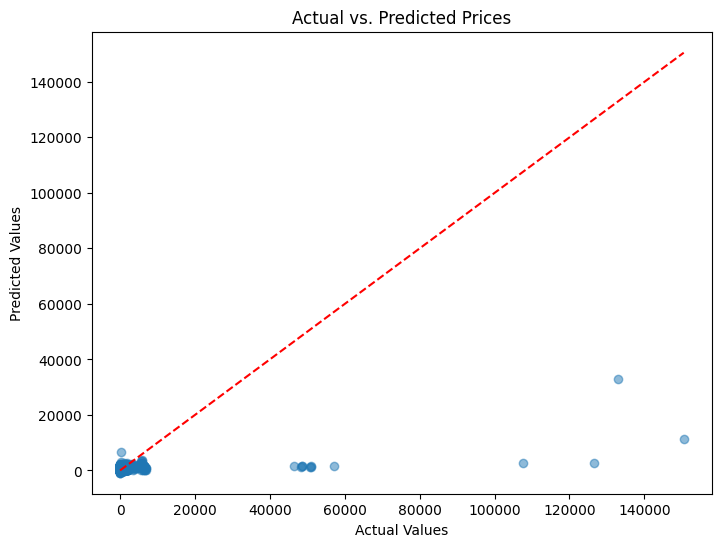

In [24]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_best, alpha=0.5)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Prices")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r', linestyle="--")  # Identity line
plt.show()

In [ ]:
#Save the Model
best_model.save_model("tabnet_best_model.zip")

Successfully saved model at tabnet_best_model.zip.zip


'tabnet_best_model.zip.zip'

In [ ]:
loaded_model = TabNetRegressor()
loaded_model.load_model("tabnet_best_model.zip")

y_loaded_pred = loaded_model.predict(X_test)
print("Loaded model RMSE:", np.sqrt(mean_squared_error(y_test, y_loaded_pred)))


In [28]:
from plotly.io import show
fig = optuna.visualization.plot_contour(study, params=["x", "y"])
show(fig)